# PROJET ANALYSE DE DONNEES
#### Etude des stations de location de vélos dans Paris

In [52]:
import pandas as pd
import numpy as np
import random as rd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('darkgrid')
import matplotlib.cm as cm
import matplotlib.patches as mpatches
import plotly.express as px
import plotly.express as px
from scipy.spatial.distance import cdist 
%matplotlib inline

Les données suivants représentent le taux de disponibilité des vélos dans toutes les stations de Paris. Nous avons accés à cette valeur toutes les heures de chaque jour de la semaine sur la période du 2 septembre au 7 septembre 2014.

Plus le taux est proche de 1 plus la stations a de vélos disponibles. Inversement, quand ce taux est proche de 0 alors il y a de moins en moins de vélos libres dans la station.

## Présentation des données

Nous allons ici importer toutes les données mises à notre disposition.

In [2]:
#loading = pd.read_csv('velibLoading.csv', sep = " ")

#loading

loading = pd.read_csv('data/velibLoading.csv', sep = " ")

loading

,Lun-00,Lun-01,Lun-02,Lun-03,Lun-04,Lun-05,Lun-06,Lun-07,Lun-08,Lun-09,...,Dim-14,Dim-15,Dim-16,Dim-17,Dim-18,Dim-19,Dim-20,Dim-21,Dim-22,Dim-23
1,0.038462,0.038462,0.076923,0.038462,0.038462,0.038462,0.038462,0.038462,0.107143,0.000000,...,0.296296,0.111111,0.111111,0.148148,0.307692,0.076923,0.115385,0.076923,0.153846,0.153846
2,0.478261,0.478261,0.478261,0.434783,0.434783,0.434783,0.434783,0.434783,0.260870,0.043478,...,0.043478,0.000000,0.217391,0.130435,0.045455,0.173913,0.173913,0.173913,0.260870,0.391304
3,0.218182,0.145455,0.127273,0.109091,0.109091,0.109091,0.090909,0.090909,0.054545,0.109091,...,0.259259,0.259259,0.203704,0.129630,0.148148,0.296296,0.314815,0.370370,0.370370,0.407407
4,0.952381,0.952381,0.952381,0.952381,0.952381,0.952381,0.952381,1.000000,1.000000,1.000000,...,1.000000,1.000000,0.904762,0.857143,0.857143,0.857143,0.761905,0.761905,0.761905,0.761905
5,0.927536,0.811594,0.739130,0.724638,0.724638,0.724638,0.724638,0.724638,0.753623,0.971014,...,0.227273,0.454545,0.590909,0.833333,1.000000,0.818182,0.636364,0.712121,0.621212,0.575758
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1185,0.000000,0.000000,0.000000,0.000000,0.000000,0.045455,0.000000,0.090909,0.136364,0.000000,...,0.043478,0.173913,0.043478,0.086957,0.086957,0.304348,0.304348,0.130435,0.086957,0.086957
1186,0.200000,0.133333,0.155556,0.177778,0.177778,0.177778,0.200000,0.177778,0.288889,0.511111,...,0.266667,0.288889,0.155556,0.222222,0.333333,0.311111,0.355556,0.377778,0.333333,0.355556
1187,0.551724,0.517241,0.551724,0.517241,0.517241,0.551724,0.551724,0.448276,0.241379,0.034483,...,0.482759,0.310345,0.000000,0.000000,0.103448,0.379310,0.310345,0.310345,0.344828,0.482759
1188,0.476190,0.428571,0.428571,0.428571,0.428571,0.428571,0.476190,0.523810,0.428571,0.476190,...,0.880000,0.760000,0.750000,0.958333,1.000000,0.791667,0.791667,0.500000,0.434783,0.478261


Il y a 168 colonnes qui représentent le total des heures dans une semaine. Les 1189 lignes correspondent aux données de toutes les stations de Paris que nous étudions ici.

In [3]:
loading.describe()

,Lun-00,Lun-01,Lun-02,Lun-03,Lun-04,Lun-05,Lun-06,Lun-07,Lun-08,Lun-09,...,Dim-14,Dim-15,Dim-16,Dim-17,Dim-18,Dim-19,Dim-20,Dim-21,Dim-22,Dim-23
count,1189.000000,1189.000000,1189.000000,1189.000000,1189.000000,1189.000000,1189.000000,1189.000000,1189.000000,1189.000000,...,1189.000000,1189.000000,1189.000000,1189.000000,1189.000000,1189.000000,1189.000000,1189.000000,1189.000000,1189.000000
mean,0.401503,0.408770,0.411718,0.415161,0.417136,0.421650,0.419860,0.415729,0.384658,0.326331,...,0.346147,0.325526,0.311334,0.306399,0.314730,0.334080,0.353493,0.385975,0.392552,0.397529
std,0.337079,0.335566,0.336132,0.337158,0.332237,0.326644,0.323422,0.319302,0.303621,0.314026,...,0.340516,0.339897,0.336863,0.331194,0.322904,0.317279,0.317572,0.328448,0.335061,0.341536
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.093750,0.093023,0.096774,0.100000,0.108696,0.114286,0.114286,0.117647,0.114286,0.047619,...,0.051282,0.041667,0.038462,0.043478,0.052632,0.071429,0.080000,0.095238,0.086957,0.090909
50%,0.312500,0.333333,0.342857,0.350000,0.357143,0.363636,0.360000,0.360000,0.320000,0.215385,...,0.204082,0.166667,0.151515,0.142857,0.172414,0.200000,0.238095,0.285714,0.292683,0.292683
75%,0.694444,0.705882,0.708333,0.710526,0.700000,0.700000,0.700000,0.687500,0.636364,0.575000,...,0.651163,0.608696,0.555556,0.550000,0.550000,0.558140,0.600000,0.666667,0.666667,0.692308
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


Les 168 colonnes represéntent comme précedemment chaque heure d'une semaine. Les lignes correspondent à differentes données calculées sur toutes les stations chaque heure.

Nous allons maintenant importer les coordonnées géographiques de chaque station. 

In [4]:
#coord = pd.read_csv('velibCoord.csv', sep = " ")

#coord.head()

coord = pd.read_csv('data/velibCoord.csv', sep = " ")

coord.head()

,longitude,latitude,bonus,names
1,2.377389,48.886300,0,EURYALE DEHAYNIN
2,2.317591,48.890020,0,LEMERCIER
3,2.330447,48.850297,0,MEZIERES RENNES
4,2.271396,48.833734,0,FARMAN
5,2.366897,48.845887,0,QUAI DE LA RAPEE


Grace à la commande ".head", nous avons affiché seulement les 5 premières lignes du tableau "coord".

## Analyse descriptive des données

Nous regardons dans cette cellule si certaines données sont manquantes, si certaines cases sont vides. 

In [5]:
print("Nombre de données manquantes dans 'loading':")
print(loading.isna().sum().sum())
print("Nombre de données manquantes dans 'coord':")
print(coord.isna().sum().sum())

Nombre de données manquantes dans 'loading':
0
Nombre de données manquantes dans 'coord':
0


Or ici, le résultat obtenu pour chaque tableau "loading" et "coord" est 0, il n'y a donc pas de donnée manquante ! 

In [6]:
loading_missing_value = loading.isna().sum().sort_values(ascending=False)

print("--- Somme des valeurs manquantes dans 'Loading' ---")
print(loading_missing_value.sum())

# --- #
print('')

coord_missing_value = coord.isna().sum().sort_values(ascending=False)

print("--- Somme des valeurs manquantes dans 'Coord' ---")
print(coord_missing_value)

--- Somme des valeurs manquantes dans 'Loading' ---
0

--- Somme des valeurs manquantes dans 'Coord' ---
longitude    0
latitude     0
bonus        0
names        0
dtype: int64


Nous affichons ici le nombre d'occurance de chaque station dans nos données.

In [7]:
print("---Données duppliquées---")
station_name = coord.names.value_counts()
print(station_name)

---Données duppliquées---
 PORTE DES LILAS                 3
 GARE D'AUSTERLITZ               3
 PORTE DE BAGNOLET               2
 CHERCHE MIDI                    2
 LEGENDRE                        2
                                ..
 BEL AIR                         1
 ASSAS LUXEMBOURG                1
 COURS DE VINCENNES BD DAVOUT    1
 RUISSEAU ORDENER                1
 QUAI VOLTAIRE                   1
Name: names, Length: 1161, dtype: int64


On peut voir dans le tableau suivant que le nom de station qui apparait 3 fois correspond à des stations qui ont le même nom mais dont les coordonnées géographiques sont différentes. Cela nous montre bien qu'il ne faut pas supprimer des lignes car même si les stations ont le même nom elles n'ont pas les mêmes caractéristiques géographiques.

In [8]:
name = station_name.index[0]
coord[coord.names == name]

,longitude,latitude,bonus,names
362,2.404770,48.876604,1,PORTE DES LILAS
450,2.405960,48.875412,1,PORTE DES LILAS
957,2.411046,48.878099,1,PORTE DES LILAS


Observons tout d'abord que les différentes moyennes des stations ne sont pas du tout homogène, et qu'il est donc, intéressant de regarder d'un peu plus près les différentes moyennes observées pour avoir une vision globale de l'impact des heures, jours et de la localisation des stations sur la comportement d'utilisation.

En effet, dans le graphe suivant, il est possible de voir que le taux de chargement moyen varie énormément.

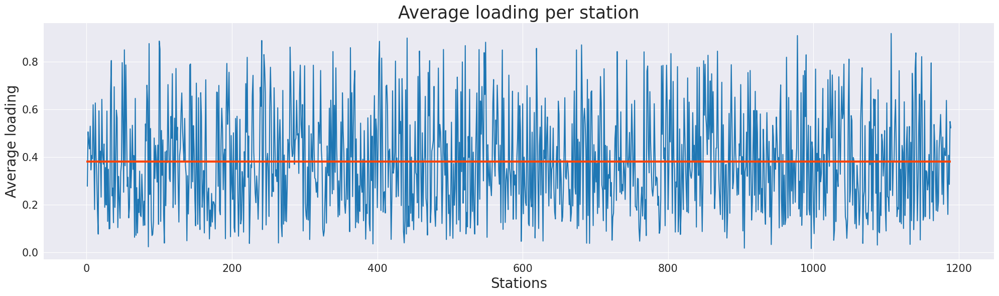

In [9]:
loading_mean = pd.Series(loading.mean(axis=1))
# %load solutions/Python/plot_mean_stations.py
n_stations = loading.shape[0]  # number of observed stations
stations   = np.arange(n_stations)

plt.figure(figsize = (20,6))

# --- #

plt.plot(loading_mean)
plt.hlines(y = loading.mean().mean(), xmin=0, xmax=n_stations, 
           colors = "OrangeRed", linewidth = 3)

# --- #

plt.xlabel('Stations', fontsize = 20)
plt.ylabel('Average loading', fontsize = 20)
plt.title("Average loading per station", fontsize = 25)
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)

plt.tight_layout()
plt.show()

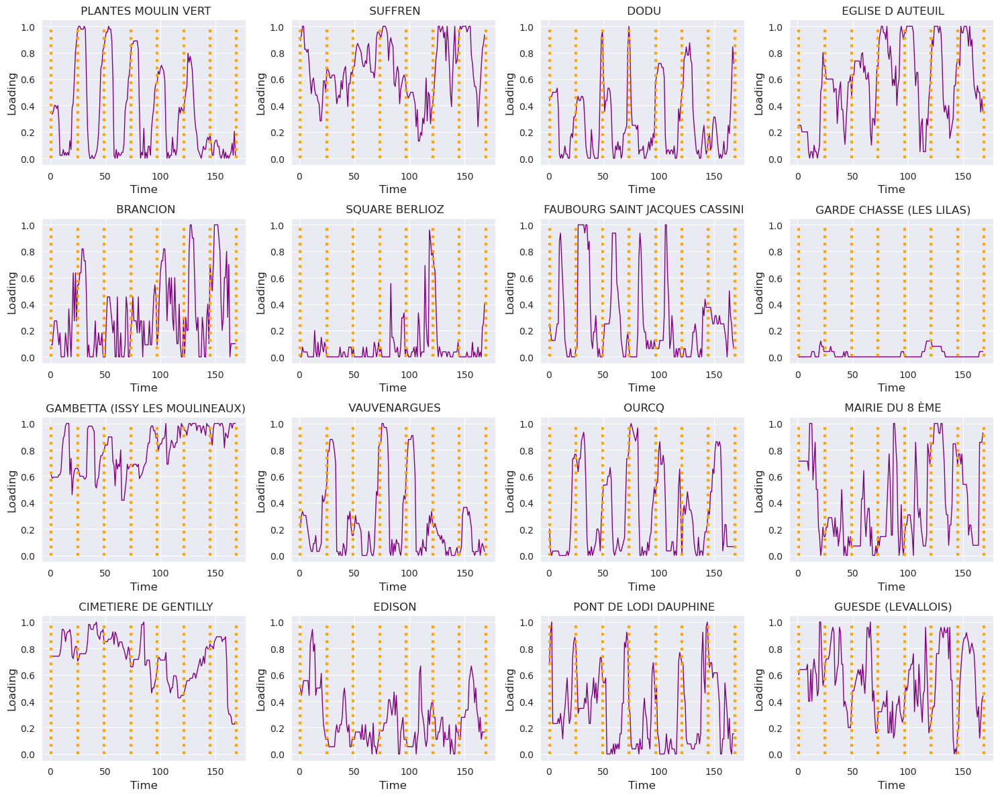

In [10]:
# We select 16 stations at random
stations = np.arange(loading.shape[0])
rd.shuffle(stations)
stations = stations[:16] 

# --- #
n_steps    = loading.shape[1] 
fig, axs = plt.subplots(4, 4, figsize = (15,12))
time_range = np.linspace(1, n_steps, n_steps) 


timeTick = np.arange(1, 25*7, 24)

for i in range(4):
    for j in range(4):
        k_station = stations[4 * i + j]
        axs[i, j].plot(time_range, loading.iloc[k_station, :], linewidth = 1, color = 'purple')
        axs[i, j].vlines(x = timeTick, ymin = 0, ymax = 1, colors = "orange", linestyle = "dotted", linewidth = 3)
        axs[i, j].set_title(coord.names[1 + k_station], fontsize = 12)

for ax in axs.flat:
    ax.set_xlabel('Time', fontsize = 12)
    ax.set_ylabel('Loading', fontsize = 12)
    ax.tick_params(axis='x', labelsize=10)
    ax.tick_params(axis='y', labelsize=10)
    
plt.tight_layout()
plt.show()

Les moyennes : 
    - Moyenne par heure par jour 
    - Station la + utilisée par jour
    - Station la - utilisée par jour 
    - Station la + utilisée par semaine 
    - Station la - utilisée par semaine 
    - heure la plus creuse d'utilisation (ie le taux est proche de 1 car tous les vélos sont à la station)
    - heure la + fréquentée (ie le taux est proche de 0)
    - jour le + fréquenté
    - Moyenne par heure par jour 

- Taux d'utilisation en moyenne sur l'ensemble des heures, jours et stations, nous donne une idée globale sur l'utilisation parisienne des vélib

On affiche dans le cadre suivant la moyenne de chargement totale sur toutes les stations au cours de la semaine.

In [11]:
print(loading.mean().mean())

0.3816217759807477


On cherche à déterminer maintenant la station la plus fréquentée, en moyenne par semaine.

In [12]:
mean=loading.mean(axis=1)
i = mean.idxmin()
print('Average fill rate :',mean[i])
print(coord.loc[i])

Average fill rate : 0.016132842025699153
longitude              2.427934
latitude              48.873929
bonus                         1
names         HORNET (BAGNOLET)
Name: 997, dtype: object


On cherche à déterminer maintenant la station la moins fréquentée, en moyenne par semaine.

In [13]:
mean=loading.mean(axis=1)
i = mean.idxmax()
print('Average fill rate :',mean[i])
print(coord.loc[i])

Average fill rate : 0.9193722943722953
longitude                          2.398262
latitude                           48.81466
bonus                                     0
names         INSURRECTION AOUT 1944 (IVRY)
Name: 1107, dtype: object


Le graphe suivant illustre le taux de chargement moyen dans tout Paris, sur la journée et pour chaque jour de la semaine.

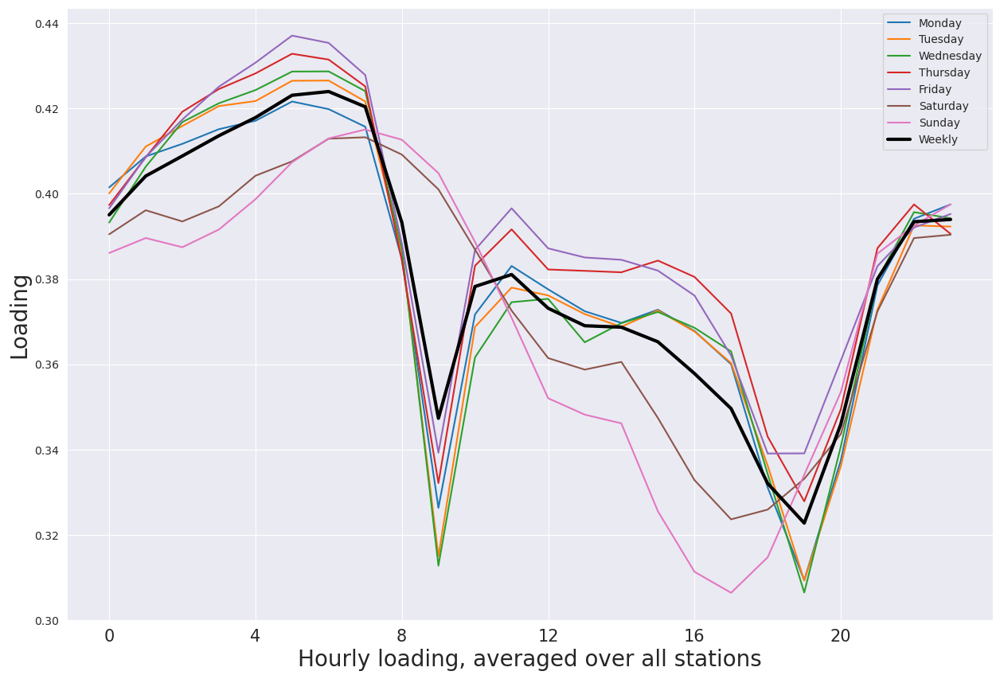

In [14]:
mean_per_hour_per_day = loading.mean(axis = 0).to_numpy()
mean_per_hour_per_day = mean_per_hour_per_day.reshape((7, 24))

mean_per_hour = mean_per_hour_per_day.mean(axis=0)

# --- #

days = ["Monday", "Tuesday", "Wednesday","Thursday", "Friday", "Saturday", "Sunday"]
plt.figure(figsize = (15,10))

plt.plot(mean_per_hour_per_day.transpose())
plt.plot(mean_per_hour, color = "black", linewidth = 3)

plt.xlabel('Hourly loading, averaged over all stations', fontsize = 20)
plt.ylabel('Loading', fontsize = 20)
plt.legend(days + ['Weekly'])
plt.xticks(ticks = np.arange(0,24,4), labels=np.arange(0,24,4), fontsize = 15)
  
plt.tight_layout
plt.show()

#A faire !!!!
#recup la moyenne la plus basse par jour 
#np.min(mean_per_hour)

#recup la moyenne la plus haute par jour 
#mean_per_hour.idmax()

#Commentaire général: cela nous permet de connaître les heures d'influence globale de l'utilisation des vélos

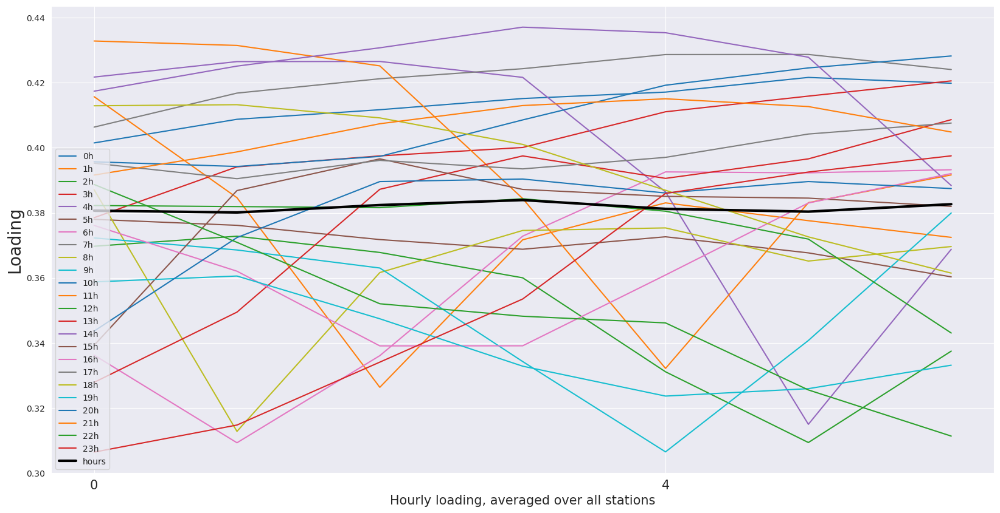

In [15]:
mean_per_hour_per_day = loading.mean(axis = 0).to_numpy()
mean_per_hour_per_day = mean_per_hour_per_day.reshape((24, 7))

mean_per_hour = mean_per_hour_per_day.mean(axis=0)

# --- #
hours = ["0h", "1h", "2h","3h", "4h", "5h", "6h", "7h", "8h", "9h", "10h", "11h", "12h", "13h", "14h", "15h", "16h", "17h", "18h", "19h", "20h", "21h", "22h", "23h"]
plt.figure(figsize = (20,10))

plt.plot(mean_per_hour_per_day.transpose())
plt.plot(mean_per_hour, color = "black", linewidth = 3)

plt.xlabel('Hourly loading, averaged over all stations', fontsize = 15)
plt.ylabel('Loading', fontsize = 20)
plt.legend(hours + ['hours'])
plt.xticks(ticks = np.arange(0,7,4), labels=np.arange(0,7,4), fontsize = 15)
  
plt.tight_layout
plt.show()

On peut ainsi voir en moyenne, à quelle heure le taux est le plus haut et à quelle heure il est le plus bas. On déduit donc qu'aux alentours de 2h-4h du matin les vélos ne sont pas beaucoup empruntés. Cependant, on peut voir qu'à 9h environ les vélos sont davantage empruntés, idem entre 19h et 20h. Ce résultat s'explique par les heures de travail de la population qui part le matin en vélo et rentre en fin de journée. 

On souhaite savoir, en moyenne, quel est le jour de la semaine, durant lequel les gens utilisent le + les vélos 
=> on voit qu'il n'y a pas vraiment de différence quand on fait la moyenne sur les jours, on ne peut pas trop dire qu'il y a un comportement qui se dégage concernant 

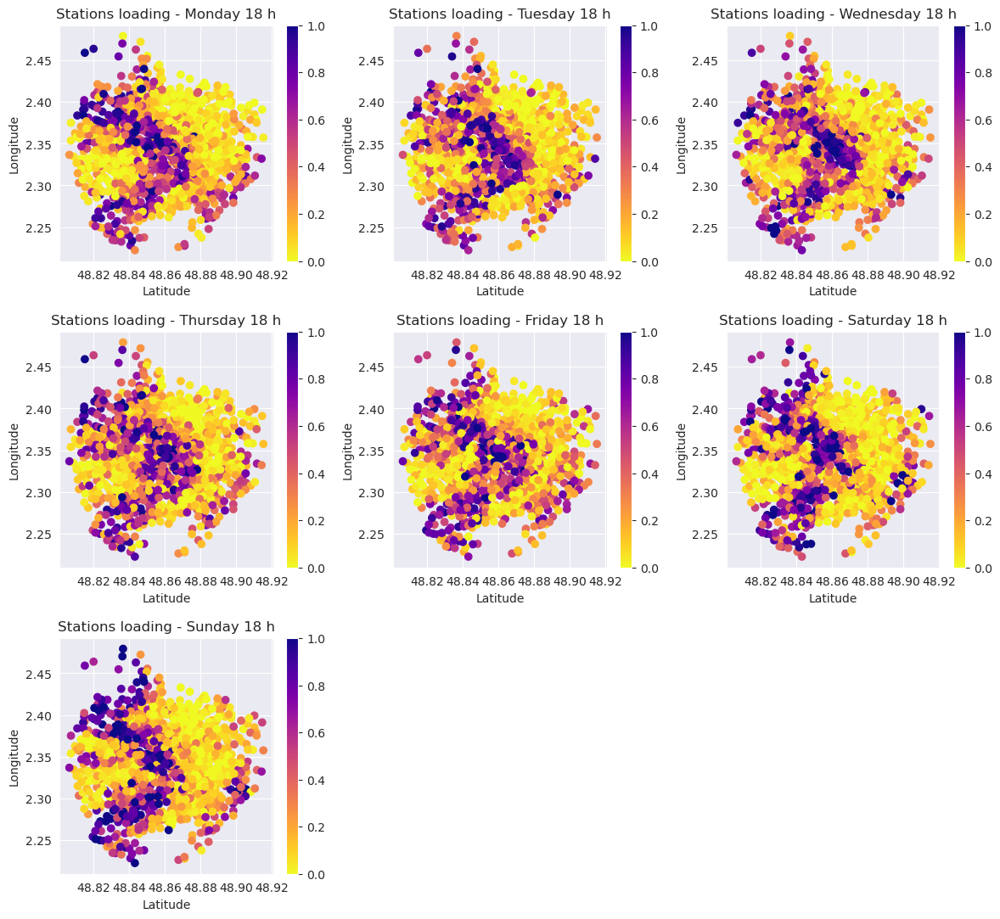

In [16]:
#on affiche le comportement des chargements des stations à 18h chaque jour
loading_data = loading.to_numpy()

h = 18
hours = np.arange(h, 168, 24)

load_per_hour = loading_data[:, hours]

days = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]

# --- #

s, m = 10, 3
k = 1 + len(days)//m

fig = plt.figure(figsize=(s+1, s))
fig.subplots_adjust(left=0, right=1, bottom=0, top=1, hspace=.3, wspace=.25)

for (i,d) in enumerate(days):
    ax = fig.add_subplot(k, m, i+1)
    im = ax.scatter(coord.latitude, coord.longitude, c = load_per_hour[:,i], cmap = cm.plasma_r)
    plt.colorbar(im)
    
    ax.set_title('Stations loading - ' + d + ' {} h'.format(h))
    ax.set_xlabel('Latitude')
    ax.set_ylabel('Longitude')
    ax.tick_params(axis='x')
    ax.tick_params(axis='y')

#plt.tight_layout()
plt.show()

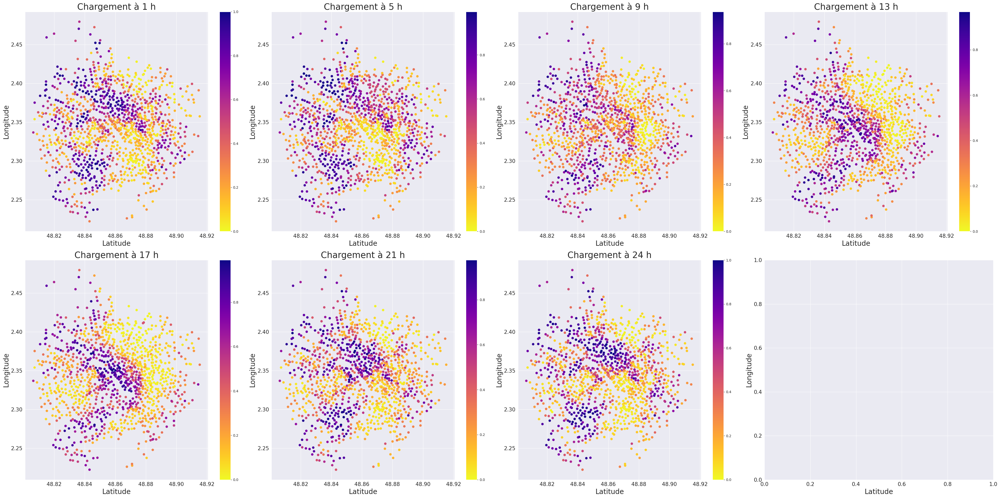

In [17]:
#on affiche le comportement moyen par heure (toutes les 4h)

hours = [1, 5, 9, 13, 17, 21, 24]

# Taille de la figure et nombre de sous-graphiques
s = 10
n = len(hours)
num_rows = 2
num_cols = (n + num_rows - 1) // num_rows
fig, axs = plt.subplots(num_rows, num_cols, figsize=(s * num_cols, s * num_rows))

for i, h in enumerate(hours):
    load_per_hour = np.mean(loading.iloc[:, h::24], axis=1)  # Calcul de la moyenne pour chaque heure sur tous les jours de la semaine
    row = i // num_cols
    col = i % num_cols
    im = axs[row, col].scatter(coord.latitude, coord.longitude, c=load_per_hour, cmap=cm.plasma_r)
    axs[row, col].set_title('Chargement à {} h'.format(h), fontsize=25)
    plt.colorbar(im, ax=axs[row, col])

for ax in axs.flat:
    ax.set_xlabel('Latitude', fontsize=20)
    ax.set_ylabel('Longitude', fontsize=20)
    ax.tick_params(axis='x', labelsize=15)
    ax.tick_params(axis='y', labelsize=15)

plt.tight_layout()
plt.show()




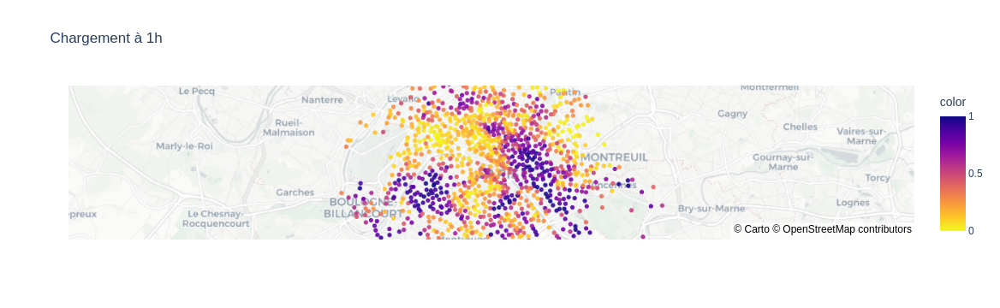

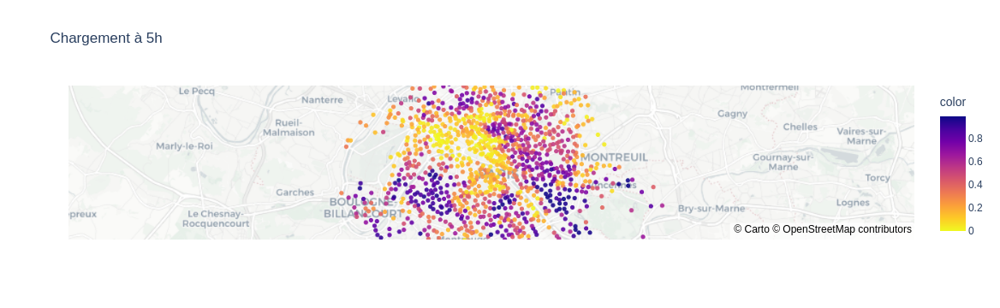

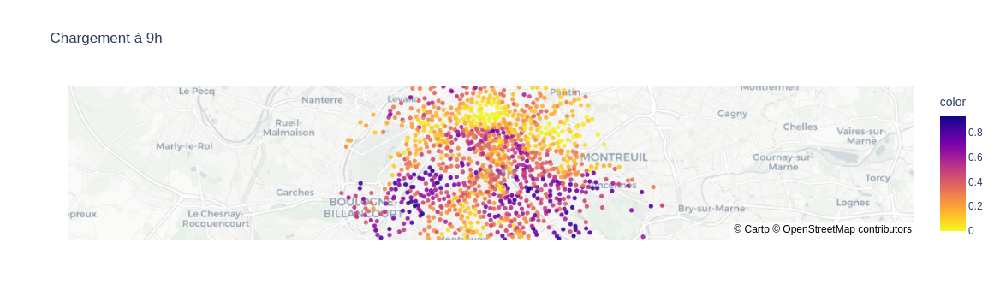

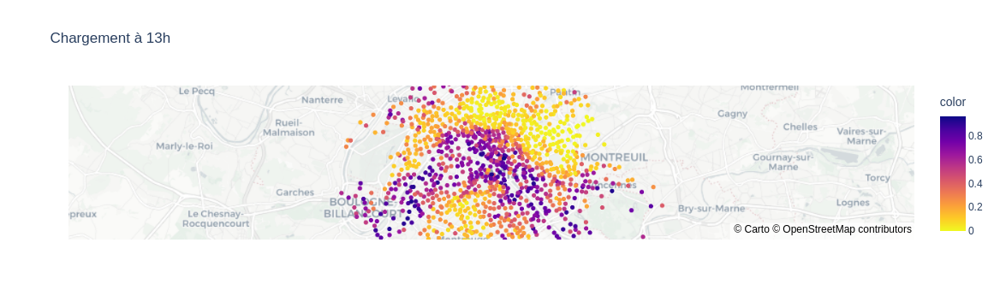

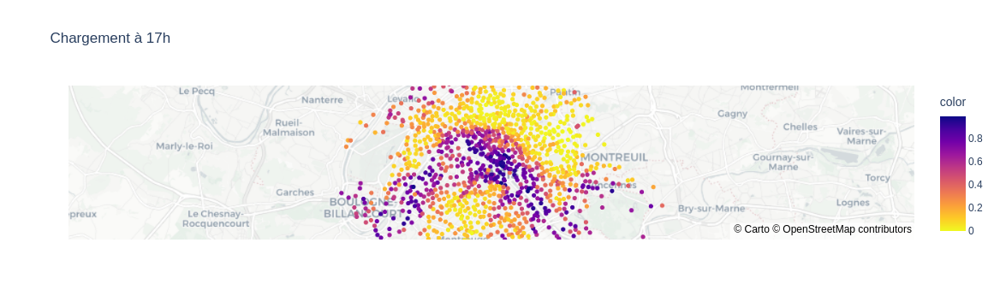

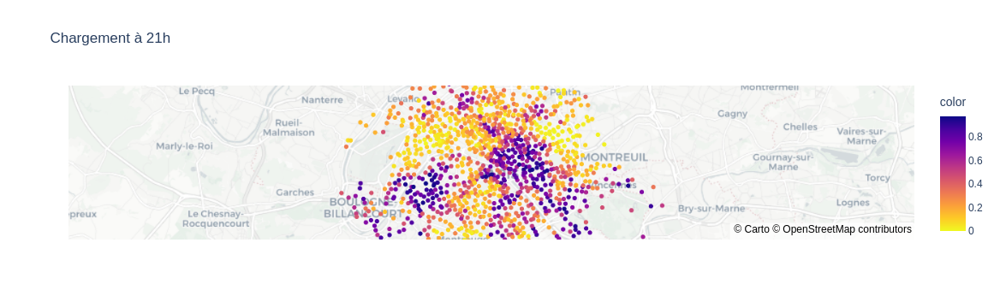

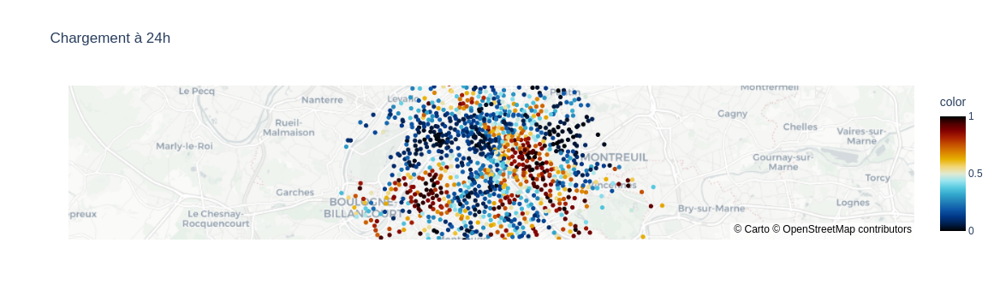

In [18]:

Position = np.array(coord)[:,0:2]

#graphe à 1h
a1 = np.arange(1,168,24, dtype=int)
data1h = np.mean(np.array(loading)[:,a1],axis=1)

fig1 = px.scatter_mapbox(data1h, Position[:,1], Position[:,0], color=data1h, color_continuous_scale = px.colors.sequential.Plasma_r, 
                        size_max=15, zoom=10,mapbox_style="carto-positron", opacity = .9,
                        title = 'Chargement à 1h')
fig1.show()

a5 = np.arange(5,168,24, dtype=int)
data5h = np.mean(np.array(loading)[:,a5],axis=1)

fig5 = px.scatter_mapbox(data5h, Position[:,1], Position[:,0], color=data5h, color_continuous_scale = px.colors.sequential.Plasma_r, 
                        size_max=15, zoom=10,mapbox_style="carto-positron", opacity = .9,
                        title = 'Chargement à 5h')
fig5.show()

a9 = np.arange(9,168,24, dtype=int)
data9h = np.mean(np.array(loading)[:,a9],axis=1)

fig9 = px.scatter_mapbox(data9h, Position[:,1], Position[:,0], color=data9h, color_continuous_scale = px.colors.sequential.Plasma_r, 
                        size_max=15, zoom=10, mapbox_style="carto-positron", opacity = .9,
                        title = 'Chargement à 9h')
fig9.show()

a13 =np.arange(13,168,24, dtype=int)
data13h = np.mean(np.array(loading)[:,a13],axis=1)

fig13 = px.scatter_mapbox(data13h, Position[:,1], Position[:,0], color=data13h, color_continuous_scale=px.colors.sequential.Plasma_r, 
                          size_max=15, zoom=10,mapbox_style="carto-positron", 
                         title = 'Chargement à 13h')
fig13.show()

a17 =np.arange(17,168,24, dtype=int)
data17h = np.mean(np.array(loading)[:,a17],axis=1)

fig17 = px.scatter_mapbox(data17h, Position[:,1], Position[:,0], color=data17h, color_continuous_scale=px.colors.sequential.Plasma_r, 
                          size_max=15, zoom=10,mapbox_style="carto-positron",
                         title = 'Chargement à 17h')
fig17.show()


a21 =np.arange(21,168,24, dtype=int)
data21h = np.mean(np.array(loading)[:,a21],axis=1)

fig21= px.scatter_mapbox(data21h, Position[:,1], Position[:,0], color=data21h, color_continuous_scale=px.colors.sequential.Plasma_r, 
                          size_max=15, zoom=10,mapbox_style="carto-positron",
                        title = 'Chargement à 21h')
fig21.show()



a24 =np.arange(24,168,24, dtype=int)
data24h = np.mean(np.array(loading)[:,a24],axis=1)

fig24 = px.scatter_mapbox(data24h, Position[:,1], Position[:,0], color=data24h, color_continuous_scale=px.colors.cyclical.IceFire, 
                          size_max=15, zoom=10,mapbox_style="carto-positron",
                         title = 'Chargement à 24h')
fig24.show()

In [45]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from matplotlib import colors
!pip install yellowbrick
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from statsmodels.graphics.mosaicplot import mosaic


Defaulting to user installation because normal site-packages is not writeable


# Etude sur le jeu de données complet 

### ACP

On commence par standardiser les données afin de centrer et de réduire les données. Afficher les données sur un jour par ex (bcp de variance apparemment)

In [20]:
# Standardiser les données quantitatives
scaler = StandardScaler()
loading_standardise = scaler.fit_transform(loading)

# Créer un nouveau DataFrame avec les données standardisées et seulement les variables quantitatives!
data_standardise = pd.DataFrame(loading_standardise, columns=loading.columns)


# Concaténer les colonnes qualitatives avec les données standardisées
#df_final = pd.concat([df[['col_qualitative_1', 'col_qualitative_2']], df_standardise], axis=1)

# Afficher le DataFrame final avec les variables standardisées pour les colonnes quantitatives
#print(df_final)


In [21]:
pca = PCA()
loading_pca = pca.fit_transform(loading)

on garde 11 composants pour le PCA


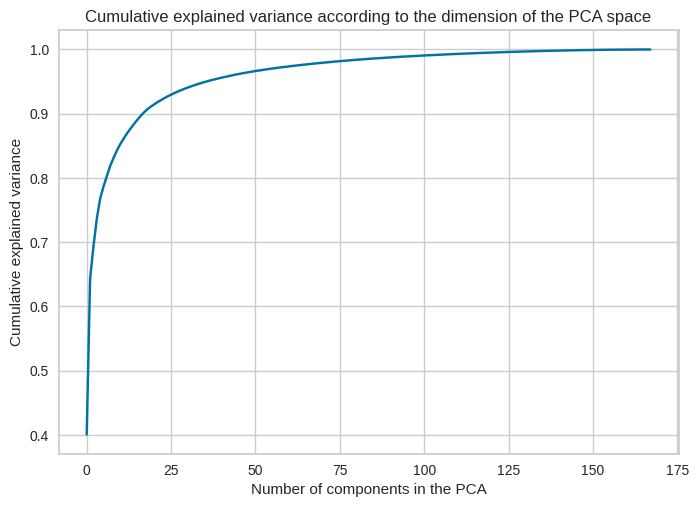

In [22]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))

plt.title('Cumulative explained variance according to the dimension of the PCA space')
plt.xlabel('Number of components in the PCA')
plt.ylabel('Cumulative explained variance');


#permet de connaître le nombre de variables à garder pour expliquer 90% de la variance 

#pca = PCA(0.90).fit(loading) 

pca = PCA(0.85).fit(loading) #pour savoir directement le nombre de composants nécessaire pour représenter une explication de 85% de la variance
pca.n_components_ #on affiche le nb de composants qu'on garde pour la PCA
print(f"on garde {pca.n_components_} composants pour le PCA")

Cependant garder 11 composantes semblent beaucoup trop, en effet quand on regarde l'histogramme des pourcentage de représentation de chaque composante, on voit qu'après la 5è composante celles-ci n'explique que très peu la variance.

In [23]:
pca = PCA(n_components=5)

loading_pca = pca.fit_transform(loading) #même chose que fit puis transform dans notre cas à nous

print(100*pca.explained_variance_ratio_)


print('--- PCA ---')
print('Initial dimension:', loading.shape)
print('Dimension after projection:', loading_pca.shape)

print('')

print('--- Explained variance ---')
print('Component 1:', round(pca.explained_variance_[0],2), 'i.e.', round(100*pca.explained_variance_ratio_[0],2), '% of the total variance')
print('Component 2:', round(pca.explained_variance_[1],2), 'i.e.', round(100*pca.explained_variance_ratio_[1],2), '% of the total variance')
print('Component 3:', round(pca.explained_variance_[2],2), 'i.e.', round(100*pca.explained_variance_ratio_[2],2), '% of the total variance')


[40.07166651 24.16919541  5.13413329  4.30937348  3.13423758]
--- PCA ---
Initial dimension: (1189, 168)
Dimension after projection: (1189, 5)

--- Explained variance ---
Component 1: 7.98 i.e. 40.07 % of the total variance
Component 2: 4.81 i.e. 24.17 % of the total variance
Component 3: 1.02 i.e. 5.13 % of the total variance


On affiche l'histogramme de ce que chaque variable explique dans le modèle

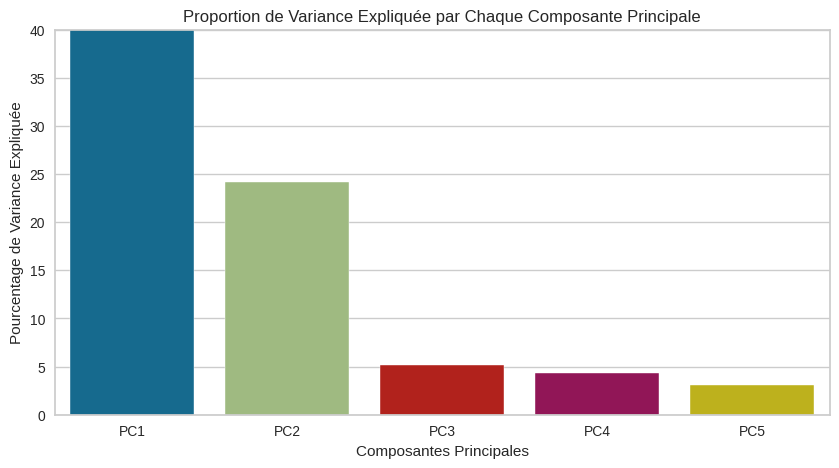

In [24]:
plt.figure(figsize=(10, 5))
sns.barplot(x=[f"PC{i+1}" for i in range(len(pca.explained_variance_ratio_))], y=pca.explained_variance_ratio_ * 100)
plt.xlabel("Composantes Principales")
plt.ylabel("Pourcentage de Variance Expliquée")
plt.title("Proportion de Variance Expliquée par Chaque Composante Principale")
plt.ylim(0, 40)  # limiter l'axe y à la plage spécifiée
plt.show()

Représentation de la PCA : projection des données sur les axes des deux composantes principales :

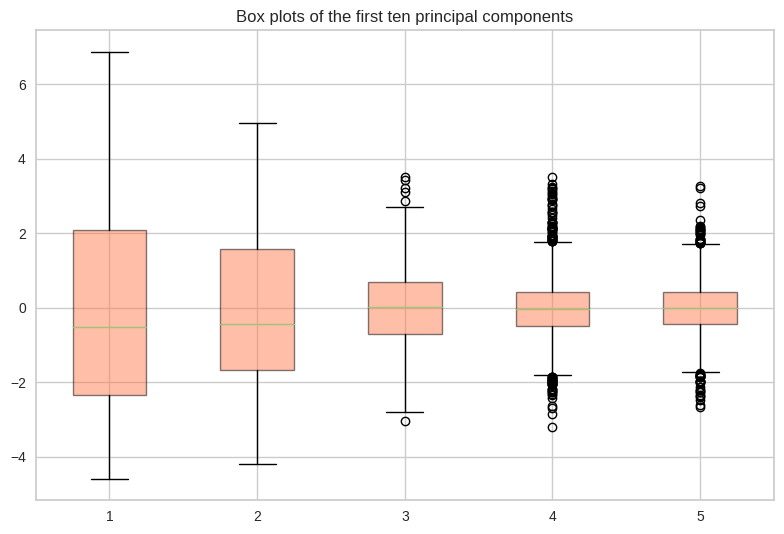

In [25]:
box = plt.boxplot(loading_pca[:,:10], patch_artist=True)
plt.setp(box["boxes"], facecolor="coral", alpha=.5)
plt.title("Box plots of the first ten principal components")
plt.tight_layout()
plt.show()

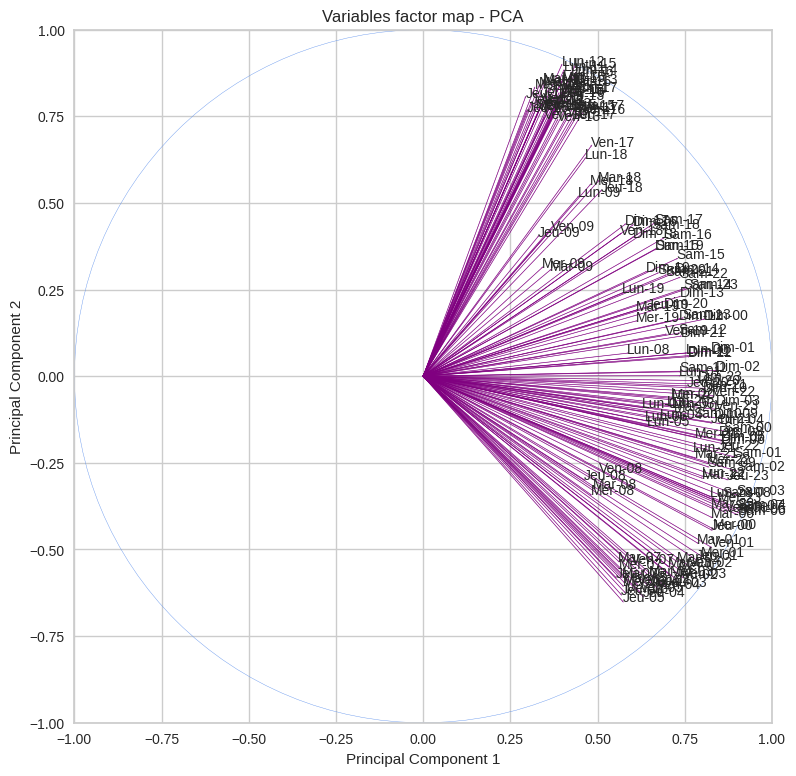

In [26]:
coord1 = pca.components_[0] * np.sqrt(pca.explained_variance_[0])
coord2 = pca.components_[1] * np.sqrt(pca.explained_variance_[1])

fig = plt.figure(figsize=(9, 9))
ax = fig.add_subplot(1, 1, 1)

arrow_length_factor = 3
# Facteur de longueur des flèches

for i, j, nom in zip(coord1, coord2, loading.columns):
    plt.text(i*arrow_length_factor, j*arrow_length_factor, nom, fontsize=10)
    plt.arrow(0, 0, i* arrow_length_factor, j* arrow_length_factor, color = 'purple', alpha=0.7, width = 0.001)

plt.axis((-1, 1, -1, 1))
plt.gcf().gca().add_artist(plt.Circle((0, 0), radius = 1, color = 'cornflowerblue', fill = False))

plt.title('Variables factor map - PCA')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')

plt.grid(True)
plt.show()



## Méthode de clustering avec k-means


In [27]:
# fonction pour afficher les nuages de points des clusters K-means

In [28]:
def plotKmeans(kmeans, data, n_clusters):

    kmeans.fit(data)

    clusters_kmeans = kmeans.predict(data)

    ax = plt.gca()

    ax.axis('equal')

    cmap = plt.get_cmap('Set3', n_clusters)

    # plot the input data (rajouter .iloc pour les kmeans non pca)
    ax.scatter(data[:, 0], data[:, 1], c=clusters_kmeans, s=1, linewidths=1, cmap=cmap)

    # plot the representation of the KMeans model
    centers = kmeans.cluster_centers_
    radius = [cdist(data[clusters_kmeans == i], [center]).max() for i, center in enumerate(centers)]
    for i in range(n_clusters):
        ax.add_patch(plt.Circle(centers[i], radius[i], fc=cmap.colors[i], alpha=0.3))

In [29]:
# fonction pour reclasser les clusters dans mat de confusions

In [30]:
def matchClasses(classif1, classif2):
    cm = confusion_matrix(classif1, classif2)
    K = cm.shape[0]
    a, b = np.zeros(K), np.zeros(K)
    for j in range(K):
        for i in range(K):
            if (a[j] < cm[i,j]):
                a[j] = cm[i,j]
                b[j] = i 
    a = a.astype(int)
    b = b.astype(int)
                                             
    print ("")
    print ("Classes size:", a)
    print ("Class (in the classif1 numbering):", b)
    print ("")
    
    table = cm.copy()
    for i in range(K):
        table[:,b[i]] = cm[:,i]   
        
    clusters = classif2.copy()
    n = classif2.shape[0]
    for i in range(n):
        for j in range(K):
            if (classif2[i] == j):
                clusters[i] = b[j]
        
    return table, clusters

In [31]:
# Etude sur loading

We will now try to find the optimal number of clusters

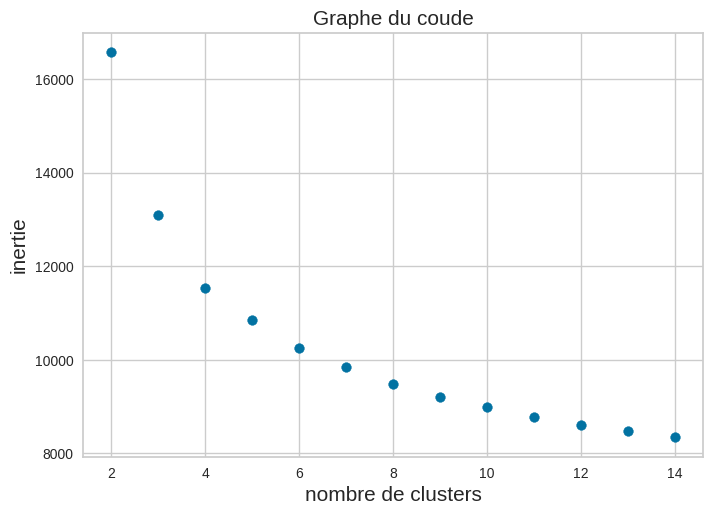

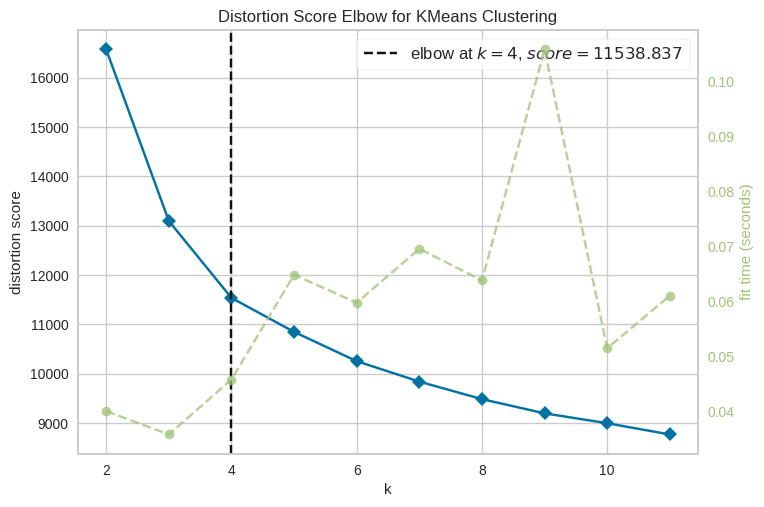

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [32]:
inertia = []
for k in range(1, 15):
    kmeans = KMeans(n_clusters=k, init='random', n_init='auto', max_iter=100, random_state=42)
    kmeans.fit(loading)
    inertia.append(kmeans.inertia_)
inertia = np.array(inertia)


plt.scatter(range(2, 15), inertia[1:])
plt.xlabel('nombre de clusters', fontsize = 15)
plt.ylabel('inertie', fontsize = 15)
plt.title("Graphe du coude", fontsize = 15)
plt.show()


# --- #


# Using yellowbrick

kmeans = KMeans(init='random', n_init='auto', max_iter=100, random_state=42)
visualizer = KElbowVisualizer(kmeans, k=(2,12))

visualizer.fit(loading)    # Fit the data to the visualizer
visualizer.show()    # Finalize and render the figure

Pour analyser ces graphes, on cherche le coude c'est à dire le moment où lorsqu'on va rajouter une composante il y aura la plus grande baisse d'inertie. Dans le premier graphe, on peut observer une différence de tendance entre 7-9. Pour le deuxième graphe, le coude est à 9.  

Nous allons maintenant utiliser la méthode "silhouette score" pour déterminer le nombre de cluster

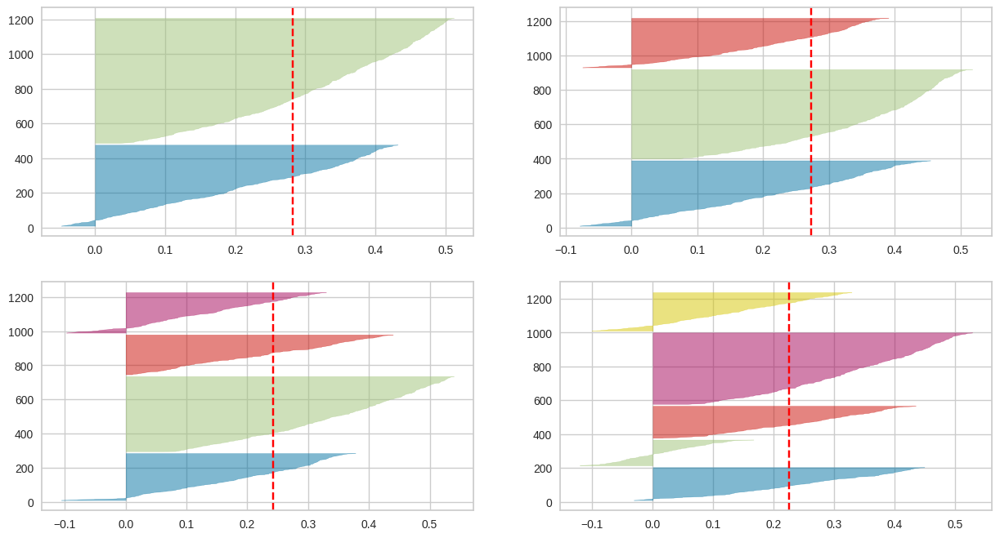

In [33]:
fig, ax = plt.subplots(2, 2, figsize=(15,8))

for k in range(2, 6):
    kmeans = KMeans(n_clusters=k, init='random', n_init='auto', max_iter=100, random_state=42)
    q, mod = divmod(k, 2) 
    # Create SilhouetteVisualizer instance with KMeans instance
    visualizer = SilhouetteVisualizer(kmeans, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(loading)

Pour choisir le nombre de clusters le plus adapté il faut trouver un équilibre entre plusieurs aspects. Tout d'abord, il faut que chaque pic dépassent le trait rouge, alors, les données sont adaptées au nombre de classes. Aussi, il faudrait dans l'idéal que chaque pic ait la même épaisseur. Enfin, il faut qu'il y ait le moins de valeurs négatives possibles, elles correspondent au nombre de variables mal classées.
Dans notre cas, il n'y a pas vraiment de situation idéale. Avec 2,3 ou 4 clusters le graphiques est plutôt bien mais il faudrait peut etre plus de clusters pour analyser le grand nombre de données que nous avons. Si on part sur 9 clusters (comme pour le graphe Elbow), le silhoutte score n'est pas parfait mais il est un bon compromis entre les aspects énoncés précedemment.

Ci-dessous on observe l'histogramme des classifications formées avec le nombre de clusters qui nous avons choisi (ici 9). 

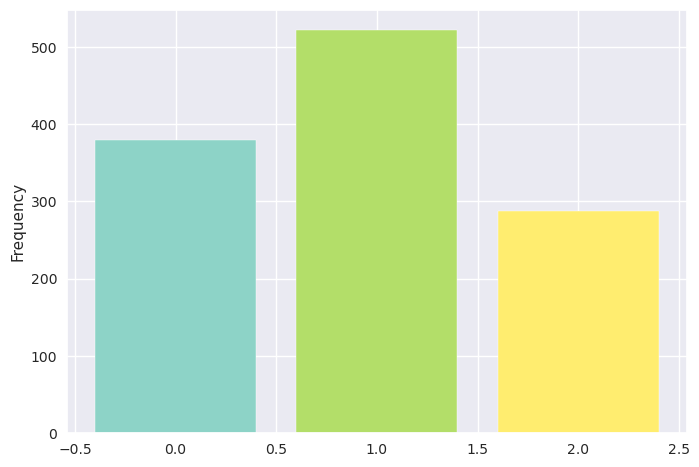

In [77]:
K = 3

kmeans = KMeans(n_clusters=K, init='random', n_init='auto', random_state=0)
clusters = kmeans.fit_predict(loading)

# ----- #

cmap = plt.get_cmap('Set3',K)
plt.bar(*np.unique(clusters, return_counts=True), color=cmap.colors)
plt.ylabel("Frequency")
plt.show()

On constate que les variables sont réparties de manière assez hétérogène. Beaucoup de variables se trouvent dans le cluster 7 et au contraire dans le cluster 0 il n'y en a pas beaucoup. Cependant, le nombre de variables est supérieur à 50 donc la répartition est raisonnable.


InvalidIndexError: (slice(None, None, None), 0)

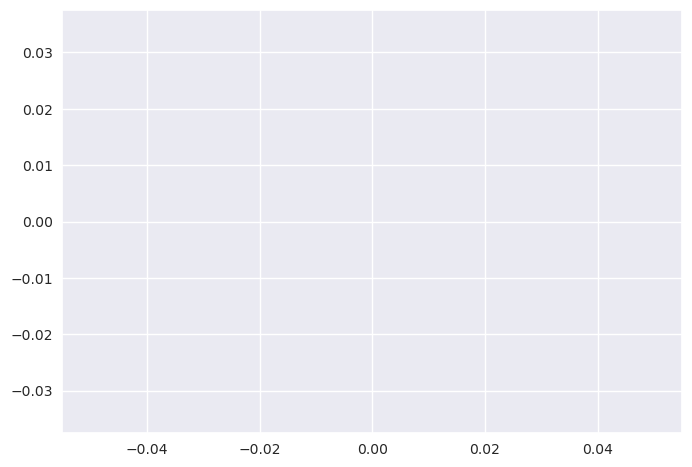

In [78]:
plotKmeans(kmeans, loading ,3)

col_0    0    1    2
bonus               
0      376  401  285
1        3  121    3


<Figure size 800x600 with 0 Axes>

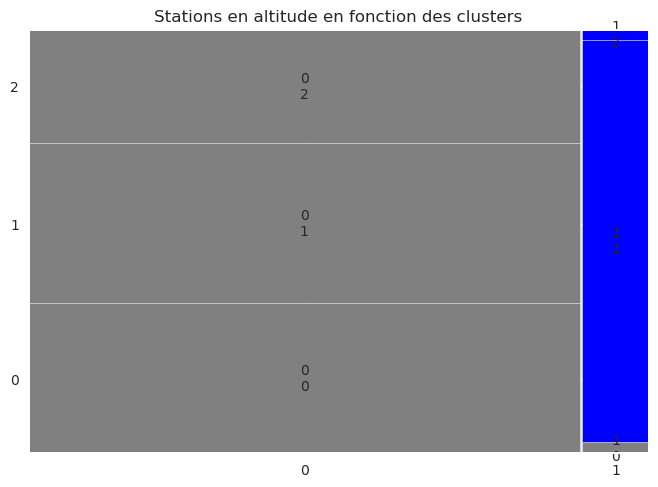

In [79]:
from statsmodels.graphics.mosaicplot import mosaic

# Créer une table croisée des données bonus et des clusters
tbl1 = pd.crosstab( coord['bonus'], clusters)

# Afficher la table croisée
print(tbl1)

props = lambda key: {'color': 'grey' if '0' in key else 'blue' if '1' in key else 'pink' }

# Réaliser un diagramme en mosaïque
plt.figure(figsize=(8, 6))
mosaic(tbl1.stack(), title="Stations en altitude en fonction des clusters",properties=props)
plt.show()


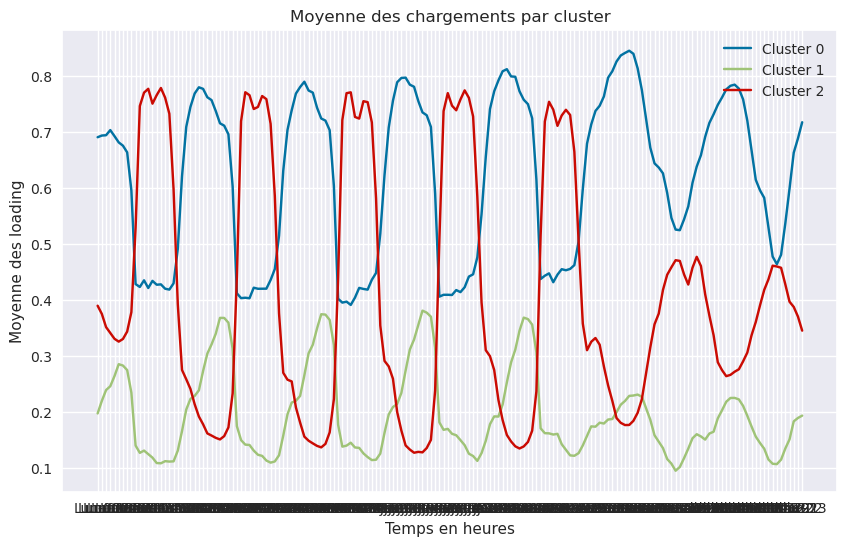

In [82]:
loading_sub1 = loading.iloc[:,:]
loading_sub1['cluster']=clusters
mean_loading1=loading_sub1.groupby('cluster').mean()
mean_loading1.head()

fig, ax = plt.subplots(figsize=(10, 6))

# Affichage des 4 lignes sur le même graphique
for i in range(3):
    ax.plot(mean_loading1.columns, mean_loading1.iloc[i], label=f'Cluster {i}')

plt.legend()
plt.title('Moyenne des chargements par cluster')
plt.xlabel('Temps en heures')
plt.ylabel('Moyenne des loading')
plt.show()


In [38]:
# Etude sur loading_pca

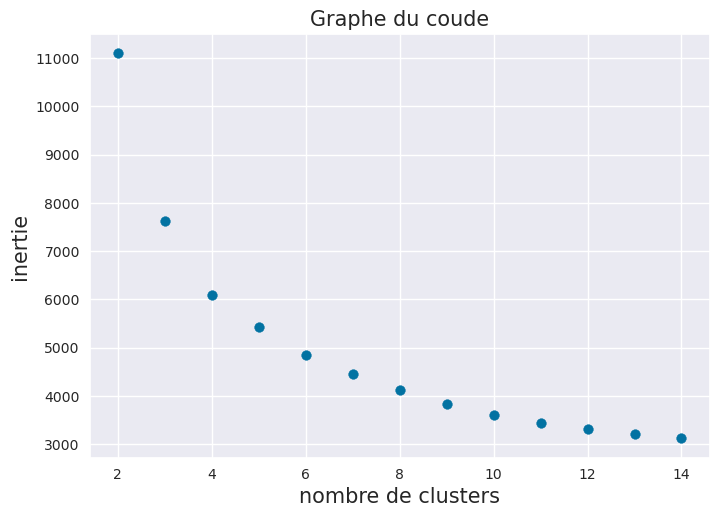

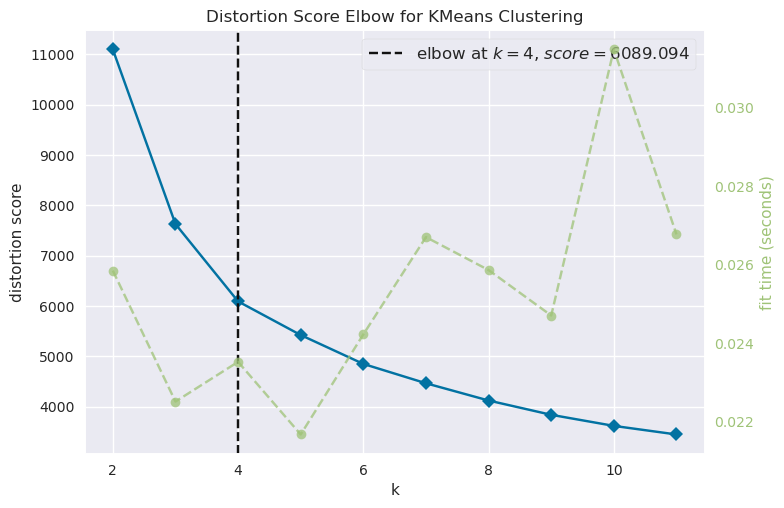

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [83]:
inertia = []
for k in range(1, 15):
    kmeans_pca = KMeans(n_clusters=k, init='random', n_init='auto', max_iter=100, random_state=42)
    kmeans_pca.fit(loading_pca)
    inertia.append(kmeans_pca.inertia_)
inertia = np.array(inertia)


plt.scatter(range(2, 15), inertia[1:])
plt.xlabel('nombre de clusters', fontsize = 15)
plt.ylabel('inertie', fontsize = 15)
plt.title("Graphe du coude", fontsize = 15)
plt.show()


# --- #


# Using yellowbrick

kmeans_pca = KMeans(init='random', n_init='auto', max_iter=100, random_state=42)
visualizer = KElbowVisualizer(kmeans_pca, k=(2,12))

visualizer.fit(loading_pca)    # Fit the data to the visualizer
visualizer.show()    # Finalize and render the figure

D'après la méthode du coude on peut dire que le nombre de clusters le plus adapté avec K-means estt de 7

Nous allons utiliser la méthode "silouhette score" pour valider le résultat précedent

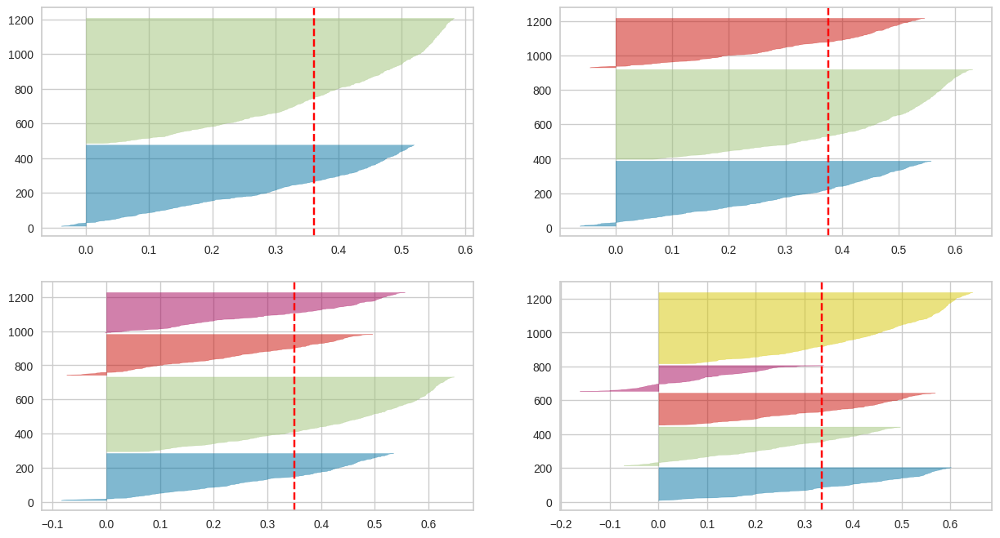

In [41]:
fig, ax = plt.subplots(2, 2, figsize=(15,8))

for k in range(2, 6):
    kmeans_pca = KMeans(n_clusters=k, init='random', n_init='auto', max_iter=100, random_state=42)
    q, mod = divmod(k, 2) 
    # Create SilhouetteVisualizer instance with KMeans instance
    visualizer = SilhouetteVisualizer(kmeans_pca, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(loading_pca)

Si on choisit un nombre de clusters égal à 3, voici l'histogramme des données associé

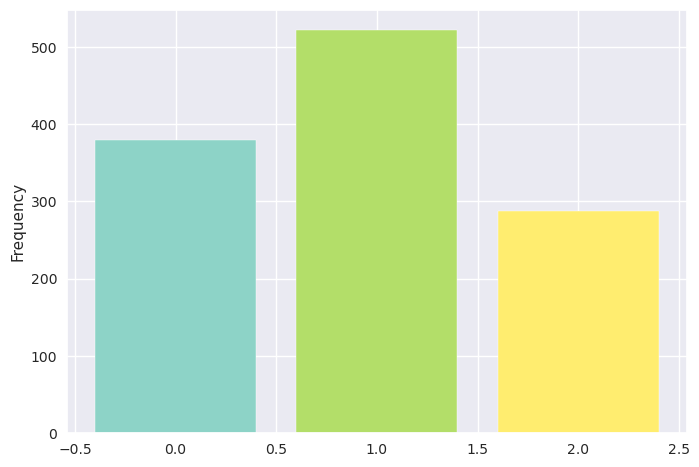

In [84]:
K = 3

kmeans_pca = KMeans(n_clusters=K, init='random', n_init='auto', random_state=0)
clusters_pca = kmeans_pca.fit_predict(loading_pca)

# ----- #

cmap = plt.get_cmap('Set3',K)
plt.bar(*np.unique(clusters, return_counts=True), color=cmap.colors)
plt.ylabel("Frequency")
plt.show()

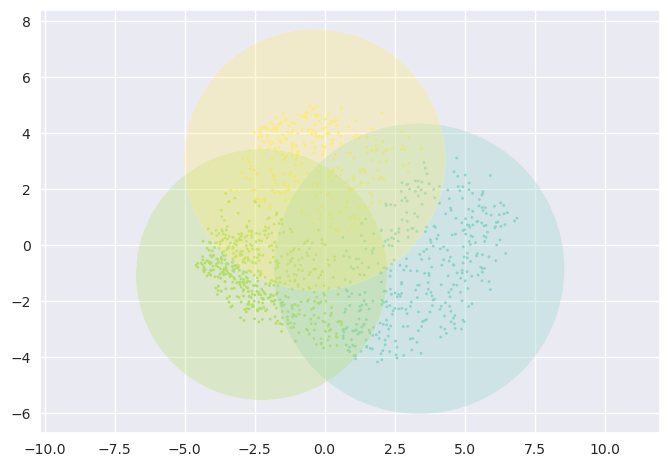

In [73]:
plotKmeans(kmeans_pca, loading_pca,3)

col_0    0    1    2
bonus               
0      376  401  285
1        3  121    3


<Figure size 800x600 with 0 Axes>

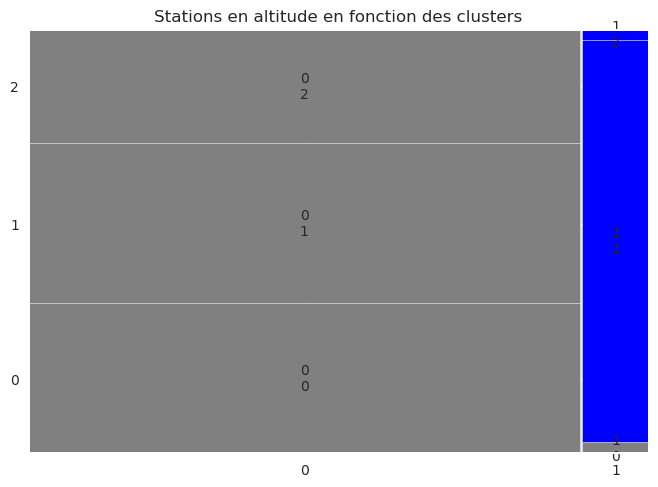

In [74]:
# Créer une table croisée des données bonus et des clusters

tbl2 = pd.crosstab( coord['bonus'], clusters_pca)
print(tbl2)

props = lambda key: {'color': 'grey' if '0' in key else 'blue' if '1' in key else 'pink' }

# Réaliser un diagramme en mosaïque
plt.figure(figsize=(8, 6))
mosaic(tbl2.stack(), title="Stations en altitude en fonction des clusters",properties=props)
plt.show()


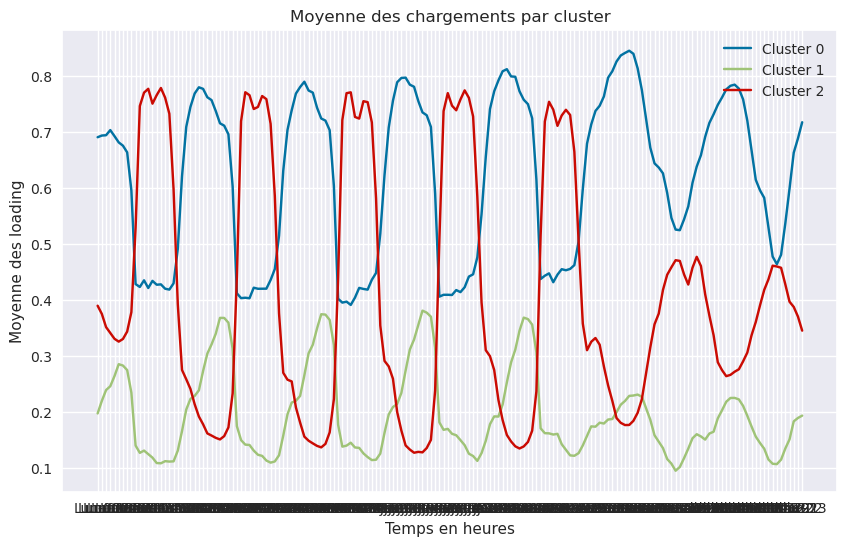

In [76]:
loading_sub2 = loading.iloc[:,:]
loading_sub2['cluster']=clusters_pca
mean_loading2=loading_sub2.groupby('cluster').mean()
mean_loading2.head()

fig, ax = plt.subplots(figsize=(10, 6))

# Affichage des 3 lignes sur le même graphique
for i in range(3):
    ax.plot(mean_loading2.columns, mean_loading2.iloc[i], label=f'Cluster {i}')

plt.legend()
plt.title('Moyenne des chargements par cluster')
plt.xlabel('Temps en heures')
plt.ylabel('Moyenne des loading')
plt.show()


Comparaison des deux classifications :

In [49]:
# visualisation des clusters grace à scatterplot

Nombre de points différents : 0 sur 1189
Pourcentage de réussite : 100.00%


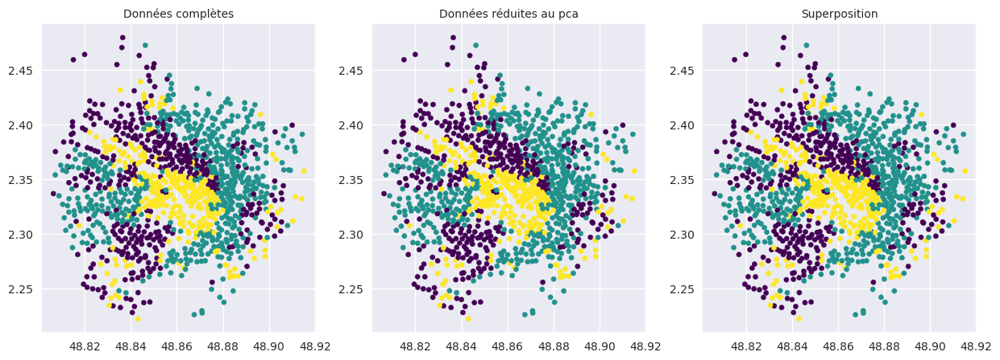

In [85]:
points_diff = clusters != clusters_pca

fig, axs = plt.subplots(1, 3, figsize = (15, 5))

#graphe 1 : données complètes
im1 = axs[0].scatter(coord.latitude, coord.longitude, c = clusters, cmap = 'viridis', s=20)
axs[0].set_title('Données complètes', fontsize = 10)

#graphe 2 : données réduites au pca
im2 = axs[1].scatter(coord.latitude, coord.longitude, c = clusters_pca, cmap = 'viridis', s=20)
axs[1].set_title('Données réduites au pca', fontsize = 10)

#graphe 3 : superposition des résultats avec affichage en noir des points différents
im3 = axs[2].scatter(coord.latitude, coord.longitude, c=clusters, cmap='viridis', s=20, label='Données réduites au PCA')
axs[2].set_title('Superposition', fontsize=10)

# Superposition des points différents en noir sur le deuxième scatterplot
axs[2].scatter(coord.latitude[points_diff], coord.longitude[points_diff], color='black', s=20, alpha=0.4, label='Différences')

# Calcul du nombre de points différents
num_diff_points = np.sum(points_diff)

# Calcul du pourcentage de réussite
pourcentage_reussite = (1- num_diff_points / len(clusters)) * 100

# Affichage du résultat
print(f"Nombre de points différents : {num_diff_points} sur {len(clusters)}")
print(f"Pourcentage de réussite : {pourcentage_reussite:.2f}%")

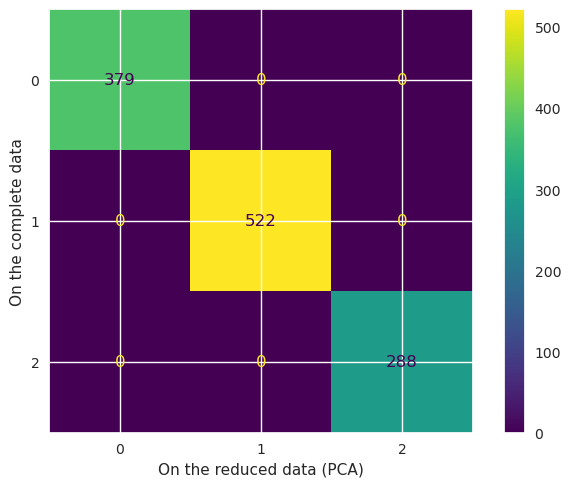

In [86]:
ConfusionMatrixDisplay(confusion_matrix(clusters, clusters_pca)).plot()
plt.xlabel('On the reduced data (PCA)')
plt.ylabel('On the complete data')
plt.show()

In [241]:
#on convertit la table de confusion en dataframe 
df_cm =pd.DataFrame(cm, columns=['groupe0', 'groupe1', 'groupe2'], index=['groupe_pca0', 'groupe_pca1', 'groupe_pca2'])
df_cm.head()


,groupe0,groupe1,groupe2
groupe_pca0,518,2,0
groupe_pca1,2,279,5
groupe_pca2,2,7,374


En affichant la table de contingence, on voit que le nombre de stations mal classifié est très faible, cela nous permet de conclure (directement et non en passant par une CA) que nos méthodes de classification sont comparables.

## Gaussian Mixture Models

On affiche d'abord la dispersion des points par cluster initiée par le modèle de mélange gaussien (GMM)

In [195]:
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score 

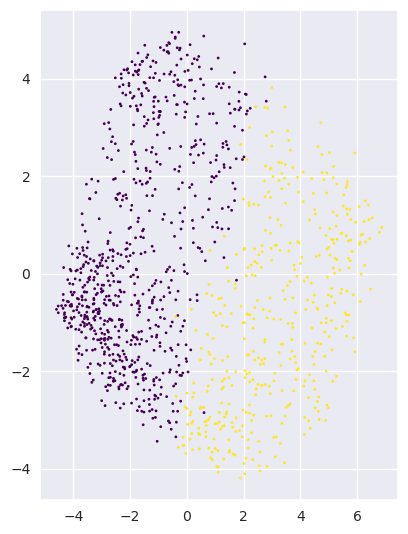

In [213]:
K = 3
cmap = plt.get_cmap('Set3', K)

gmm = GaussianMixture(n_components=K, n_init=3)
clusters_gmm_loading = gmm.fit_predict(loading)

# --- #

# on a montré que l'on pouvait réduire notre étude sur le jeu de données loading_pca car il résume correctement nos données, on fait donc l'analyse GMM avec ce jeu de données
plt.subplot(1,2,1)
plt.scatter(loading_pca[:,0], loading_pca[:,1], c=clusters_gmm, s=1, linewidths=1, cmap='viridis')
plt.grid(True)


plt.tight_layout()
plt.show()

Critère BIC :

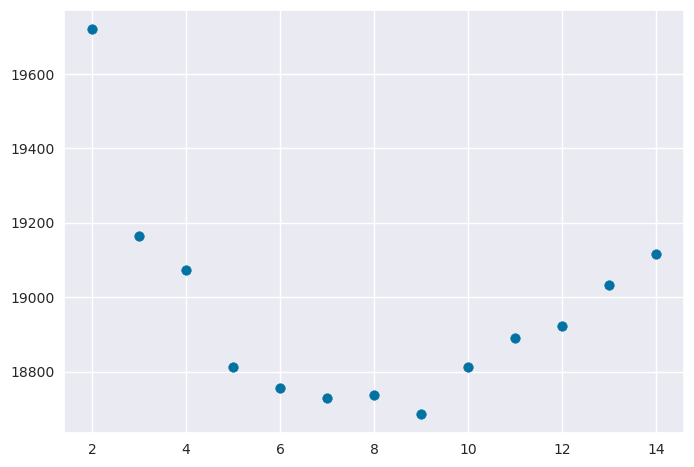

In [214]:
k_max = 15

bic = []
for k in range(2, k_max):
    gmm = GaussianMixture(n_components=k, init_params='kmeans', n_init=3)
    gmm.fit(loading_pca)
    bic.append(gmm.bic(loading_pca))
bic = np.array(bic)

plt.scatter(range(2, k_max), bic)
plt.show()

Avec le critère BIC, on voit que le meilleur modèle qui explique nos données nécessite aux moins 6 variables.

Réalisons maintenant une étude comparative des différentes méthodes de clusters : 

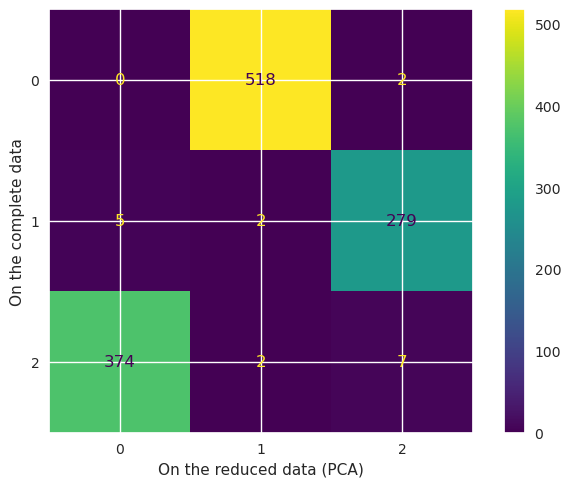

In [215]:
ConfusionMatrixDisplay(confusion_matrix(clusters_gmm_loading, clusters_pca)).plot()
plt.xlabel('On the reduced data (PCA)')
plt.ylabel('On the complete data')
plt.show()

In [235]:
#Reclassement des groupes 
df_Kmeans_gmm = pd.DataFrame(cm, columns=['groupe0', 'groupe1', 'groupe2'], index=['groupe_pca0', 'groupe_pca1', 'groupe_pca2'])
df_Kmeans_gmm.head()

,groupe0,groupe1,groupe2
groupe_pca0,518,2,0
groupe_pca1,2,279,5
groupe_pca2,2,7,374


# Etude sur le jeu de données par jour

In [101]:
lundi = loading.iloc[:, list(range(0, 24))].mean(axis=1)
mardi = loading.iloc[:, list(range(24, 48))].mean(axis=1)
mercredi = loading.iloc[:, list(range(48, 72))].mean(axis=1)
jeudi = loading.iloc[:, list(range(72, 96))].mean(axis=1)
vendredi = loading.iloc[:, list(range(96, 120))].mean(axis=1)
samedi = loading.iloc[:, list(range(120, 144))].mean(axis=1)
dimanche = loading.iloc[:, list(range(144, 168))].mean(axis=1)

data_jours = pd.DataFrame({
    'lundi': lundi,
    'mardi': mardi,
    'mercredi': mercredi,
    'jeudi': jeudi,
    'vendredi': vendredi,
    'samedi': samedi,
    'dimanche': dimanche
})

print(data_jours)

         lundi     mardi  mercredi     jeudi  vendredi    samedi  dimanche
1     0.111149  0.296462  0.378527  0.361387  0.418596  0.244819  0.134081
2     0.342391  0.579710  0.510870  0.572464  0.528986  0.605072  0.404068
3     0.273874  0.626680  0.389394  0.456818  0.571731  0.532141  0.416667
4     0.759921  0.367063  0.309193  0.330260  0.311508  0.311508  0.652778
5     0.736609  0.608376  0.550716  0.450216  0.598082  0.356832  0.408460
...        ...       ...       ...       ...       ...       ...       ...
1185  0.027668  0.168478  0.226449  0.307724  0.077899  0.155797  0.150362
1186  0.252778  0.345370  0.499074  0.606481  0.325000  0.405556  0.419444
1187  0.273420  0.206944  0.336111  0.280556  0.213889  0.173755  0.514368
1188  0.666667  0.809524  0.429762  0.091667  0.245000  0.750000  0.854363
1189  0.790911  0.489645  0.471711  0.440104  0.328027  0.460265  0.679703

[1189 rows x 7 columns]


In [102]:
# Standardisation des données
scaler = StandardScaler()
données_jours_stand = scaler.fit_transform(data_jours)
print(données_jours_stand)

[[-1.07221358 -0.38869893 -0.01142962 ...  0.12356571 -0.45839501
  -0.82452521]
 [-0.15365853  0.9104416   0.58992227 ...  0.61229048  0.80013731
   0.11011231]
 [-0.42582695  1.12587164  0.0379473  ...  0.80153689  0.54535323
   0.15372678]
 ...
 [-0.42763277 -0.79927627 -0.20416537 ... -0.78272502 -0.70665617
   0.49194779]
 [ 1.13444971  1.96449922  0.22137592 ... -0.64498796  1.30643667
   1.66893996]
 [ 1.62797983  0.49734912  0.41198902 ... -0.27740565  0.294259
   1.06430279]]


In [103]:
pca_2 = PCA()
data_jours_pca = pca_2.fit_transform(données_jours_stand)

on garde 3 composants pour le PCA


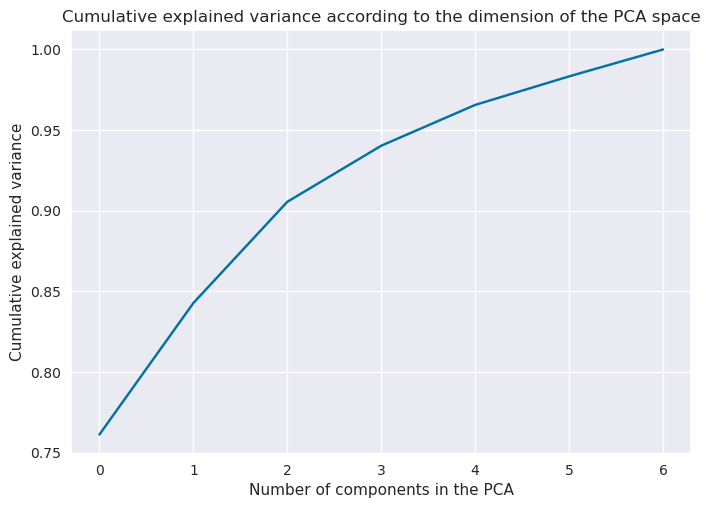

In [104]:
plt.plot(np.cumsum(pca_2.explained_variance_ratio_))

plt.title('Cumulative explained variance according to the dimension of the PCA space')
plt.xlabel('Number of components in the PCA')
plt.ylabel('Cumulative explained variance');


#permet de connaître le nombre de variables à garder pour expliquer 90% de la variance 

#pca = PCA(0.90).fit(loading) 

pca_2 = PCA(0.85).fit(données_jours_stand) #pour savoir directement le nombre de composants nécessaire pour représenter une explication de 85% de la variance
pca_2.n_components_ #on affiche le nb de composants qu'on garde pour la PCA
print(f"on garde {pca_2.n_components_} composants pour le PCA")



In [105]:
pca_2=PCA(n_components=2)
data_jours_pca = pca_2.fit_transform(données_jours_stand) #même chose que fit puis transform dans notre cas à nous

print(100*pca_2.explained_variance_ratio_)


print('--- PCA ---')
print('Initial dimension:', data_jours.shape)
print('Dimension after projection:', data_jours_pca.shape)

print('')

print('--- Explained variance ---')
print('Component 1:', round(pca_2.explained_variance_[0],2), 'i.e.', round(100*pca_2.explained_variance_ratio_[0],2), '% of the total variance')
print('Component 2:', round(pca_2.explained_variance_[1],2), 'i.e.', round(100*pca_2.explained_variance_ratio_[1],2), '% of the total variance')


[76.12784029  8.15212142]
--- PCA ---
Initial dimension: (1189, 7)
Dimension after projection: (1189, 2)

--- Explained variance ---
Component 1: 5.33 i.e. 76.13 % of the total variance
Component 2: 0.57 i.e. 8.15 % of the total variance


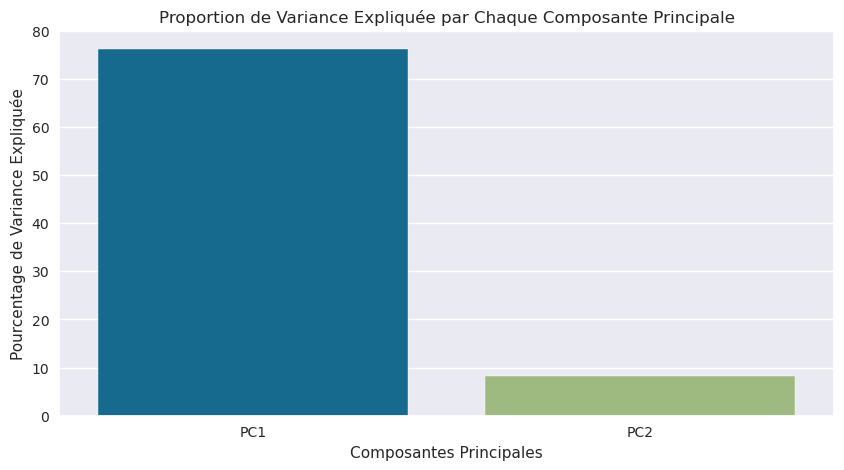

In [106]:
plt.figure(figsize=(10, 5))
sns.barplot(x=[f"PC{i+1}" for i in range(len(pca_2.explained_variance_ratio_))], y=pca_2.explained_variance_ratio_ * 100)
plt.xlabel("Composantes Principales")
plt.ylabel("Pourcentage de Variance Expliquée")
plt.title("Proportion de Variance Expliquée par Chaque Composante Principale")
plt.ylim(0, 80)  # limiter l'axe y à la plage spécifiée
plt.show()

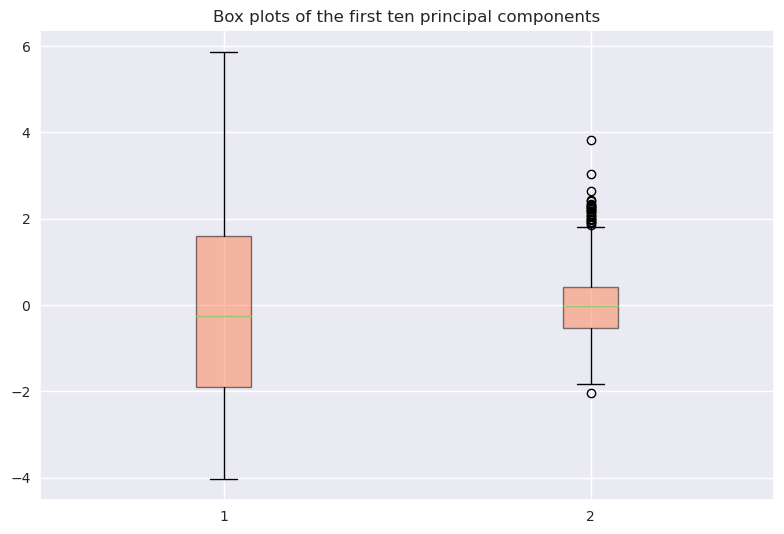

In [107]:
box = plt.boxplot(data_jours_pca[:,:10], patch_artist=True)
plt.setp(box["boxes"], facecolor="coral", alpha=.5)
plt.title("Box plots of the first ten principal components")
plt.tight_layout()
plt.show()

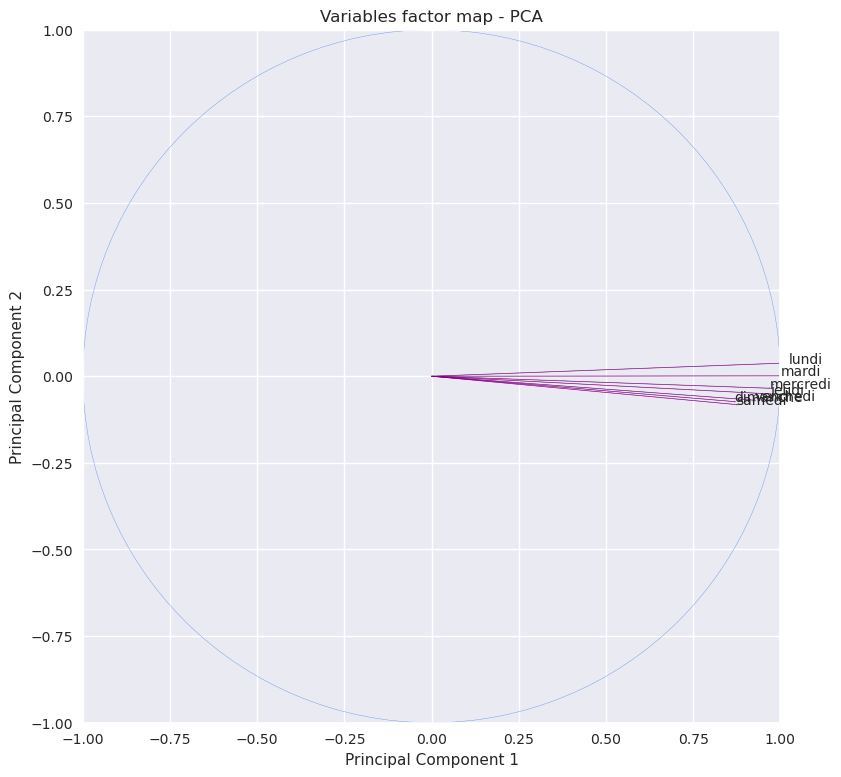

In [108]:
coord1 = pca.components_[0] * np.sqrt(pca_2.explained_variance_[0])
coord2 = pca.components_[1] * np.sqrt(pca_2.explained_variance_[1])

fig = plt.figure(figsize=(9, 9))
ax = fig.add_subplot(1, 1, 1)


arrow_length_factor = 5

for i, j, nom in zip(coord1, coord2, data_jours.columns):
    plt.text(i*arrow_length_factor, j*arrow_length_factor, nom, fontsize=10)
    plt.arrow(0, 0, i* arrow_length_factor, j* arrow_length_factor, color = 'purple', alpha=0.7, width = 0.001)

plt.axis((-1, 1, -1, 1))
plt.gcf().gca().add_artist(plt.Circle((0, 0), radius = 1, color = 'cornflowerblue', fill = False))

plt.title('Variables factor map - PCA')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')

plt.grid(True)
plt.show()



ACP nous dit donc que l'on peut ecpliquer les jours de la semaine avec deux variables au lieu de 7, pour expliquer + de 90% de la variance. Cependant comme pour l'ACP précédente les affichages sont pas jolis.

## Méthode de clustering avec k-means


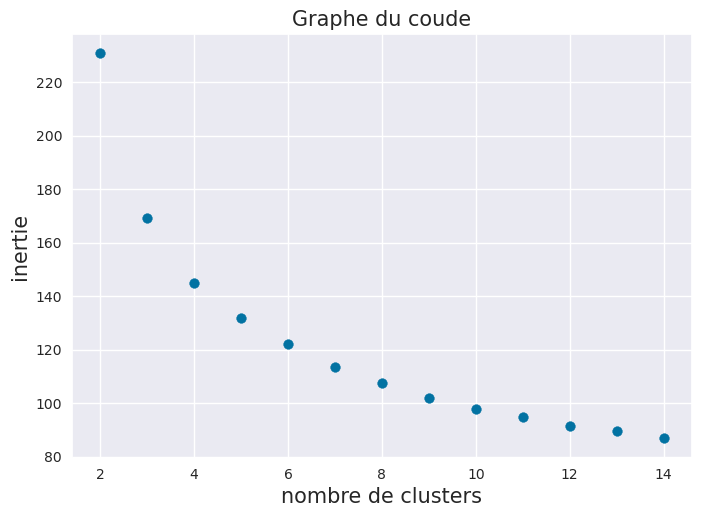

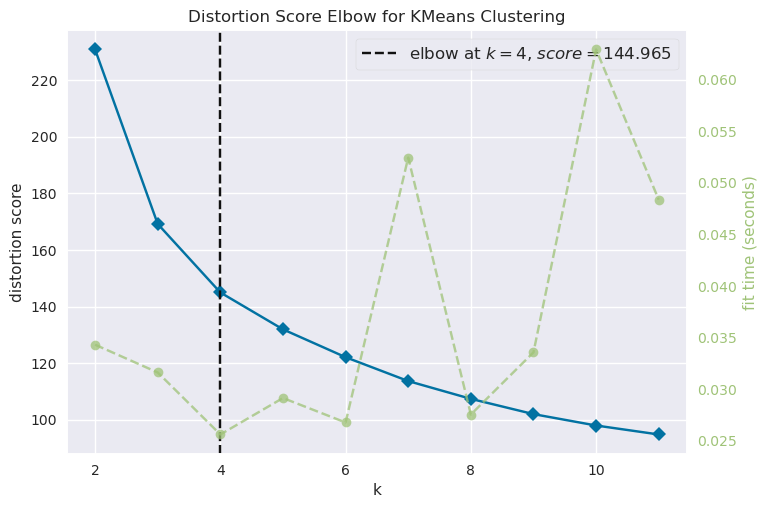

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [109]:
inertia = []
for k in range(1, 15):
    kmeans_jours = KMeans(n_clusters=k, init='random', n_init='auto', max_iter=100, random_state=42)
    kmeans_jours.fit(data_jours)
    inertia.append(kmeans_jours.inertia_)
inertia = np.array(inertia)


plt.scatter(range(2, 15), inertia[1:])
plt.xlabel('nombre de clusters', fontsize = 15)
plt.ylabel('inertie', fontsize = 15)
plt.title("Graphe du coude", fontsize = 15)
plt.show()


# --- #


# Using yellowbrick

kmeans_jours = KMeans(init='random', n_init='auto', max_iter=100, random_state=42)
visualizer = KElbowVisualizer(kmeans_jours, k=(2,12))

visualizer.fit(data_jours)    # Fit the data to the visualizer
visualizer.show()    # Finalize and render the figure

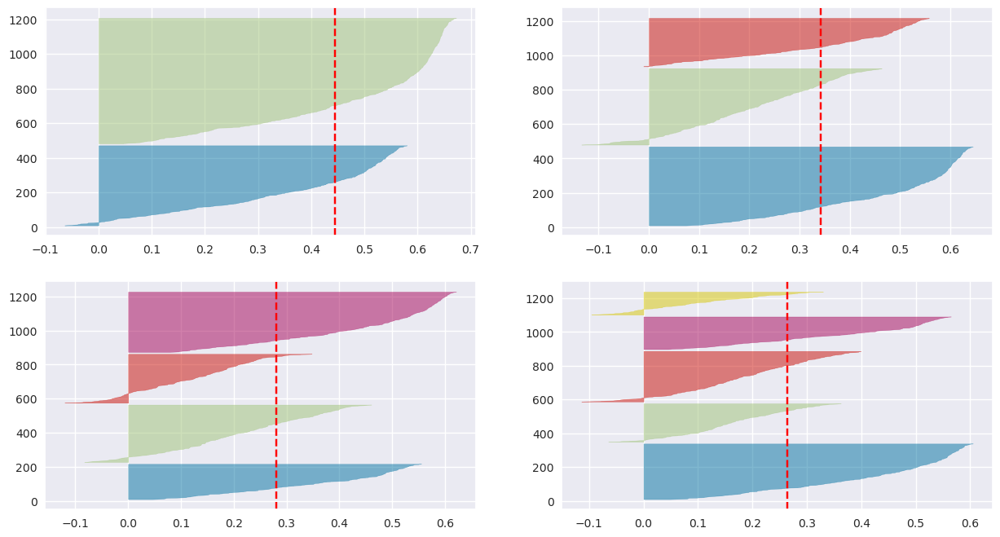

In [110]:
fig, ax = plt.subplots(2, 2, figsize=(15,8))

for k in range(2, 6):
    kmeans_jours = KMeans(n_clusters=k, init='random', n_init='auto', max_iter=100, random_state=42)
    q, mod = divmod(k, 2) 
    # Create SilhouetteVisualizer instance with KMeans instance
    visualizer = SilhouetteVisualizer(kmeans_jours, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(data_jours)

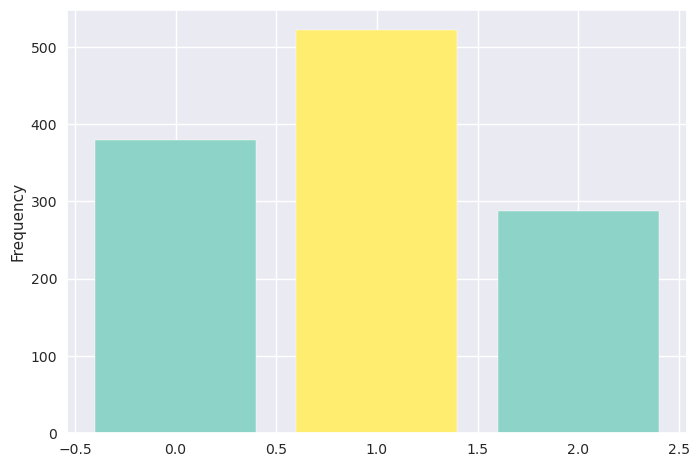

In [128]:
K = 2

kmeans_jours = KMeans(n_clusters=K, init='random', n_init='auto', random_state=0)
clusters_jours = kmeans_jours.fit_predict(data_jours)

# ----- #

cmap = plt.get_cmap('Set3',K)
plt.bar(*np.unique(clusters, return_counts=True), color=cmap.colors)
plt.ylabel("Frequency")
plt.show()

InvalidIndexError: (slice(None, None, None), 0)

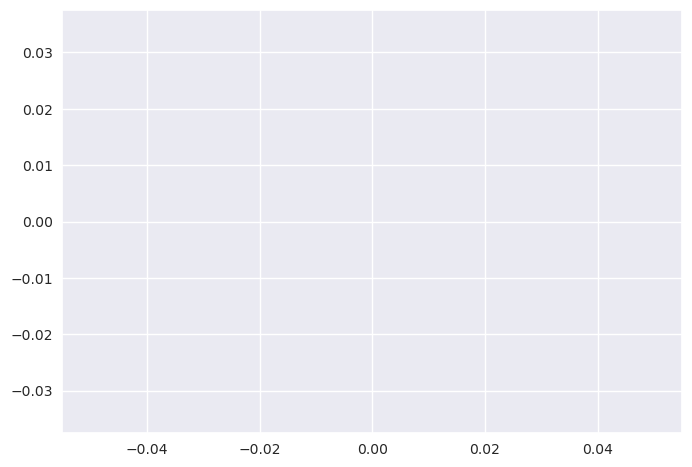

In [130]:
plotKmeans(kmeans_jours, data_jours,2)

col_0    0    1
bonus          
0      461  601
1        2  125


<Figure size 800x600 with 0 Axes>

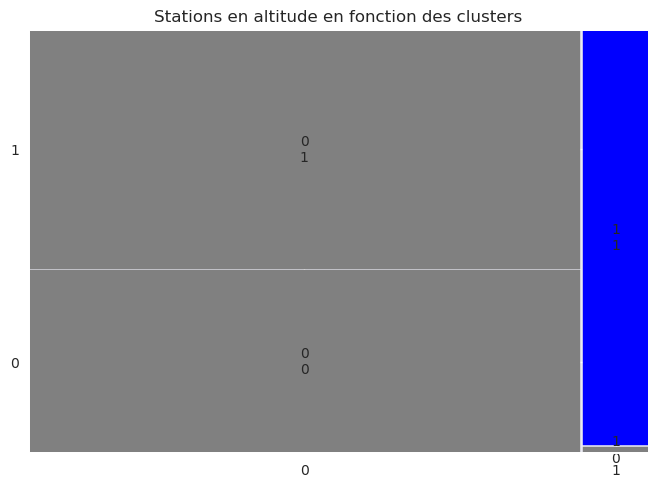

In [131]:
# Créer une table croisée des données bonus et des clusters

tbl3 = pd.crosstab( coord['bonus'], clusters_jours)
print(tbl3)

props = lambda key: {'color': 'grey' if '0' in key else 'blue' if '1' in key else 'pink' }

# Réaliser un diagramme en mosaïque
plt.figure(figsize=(8, 6))
mosaic(tbl3.stack(), title="Stations en altitude en fonction des clusters",properties=props)
plt.show()


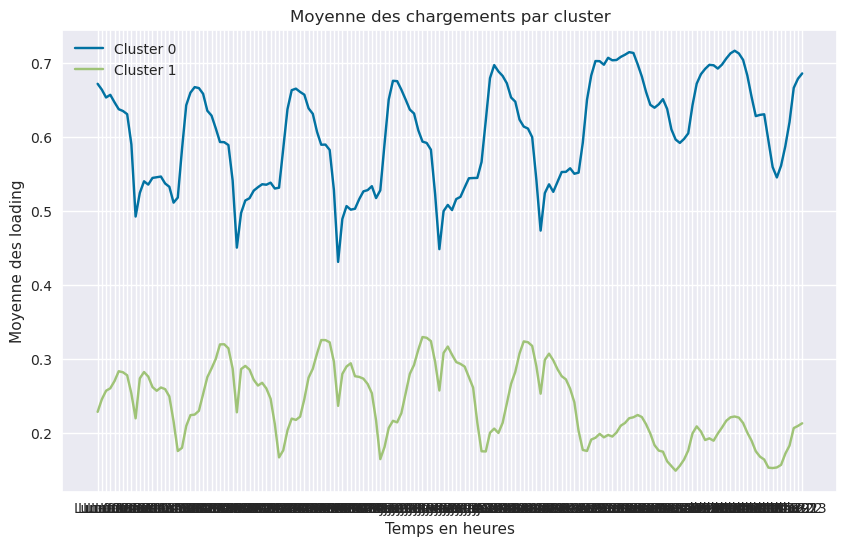

In [133]:
loading_sub3 = loading.iloc[:,:]
loading_sub3['cluster']=clusters_jours
mean_loading3=loading_sub3.groupby('cluster').mean()
mean_loading3.head()

fig, ax = plt.subplots(figsize=(10, 6))

# Affichage des 4 lignes sur le même graphique
for i in range(2):
    ax.plot(mean_loading3.columns, mean_loading3.iloc[i], label=f'Cluster {i}')

plt.legend()
plt.title('Moyenne des chargements par cluster')
plt.xlabel('Temps en heures')
plt.ylabel('Moyenne des loading')
plt.show()


In [113]:
# Etude sur data_jours_pca

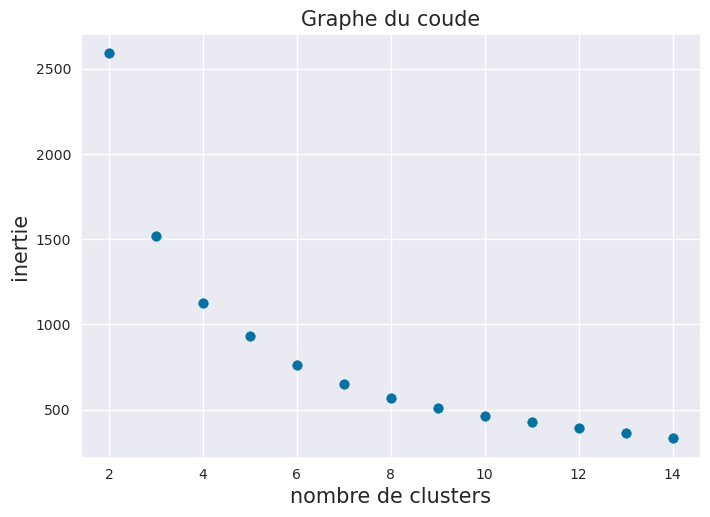

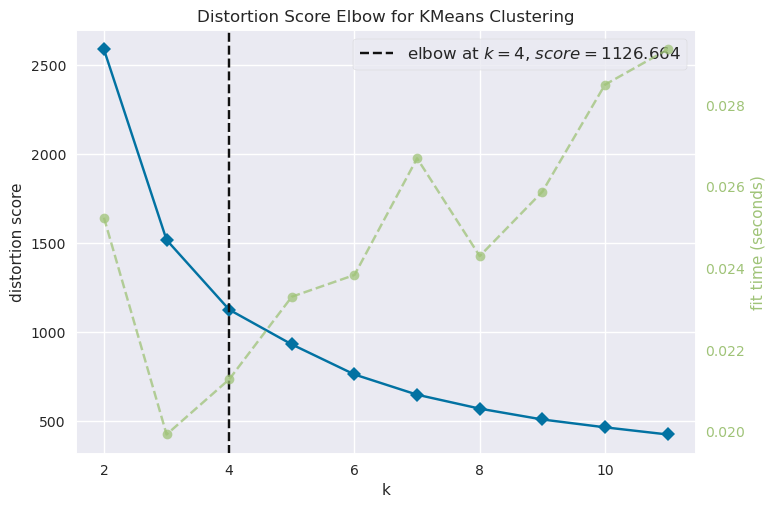

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [134]:
inertia = []
for k in range(1, 15):
    kmeans_PCA_jours = KMeans(n_clusters=k, init='random', n_init='auto', max_iter=100, random_state=42)
    kmeans_PCA_jours.fit(data_jours_pca )
    inertia.append(kmeans_PCA_jours.inertia_)
inertia = np.array(inertia)


plt.scatter(range(2, 15), inertia[1:])
plt.xlabel('nombre de clusters', fontsize = 15)
plt.ylabel('inertie', fontsize = 15)
plt.title("Graphe du coude", fontsize = 15)
plt.show()


# --- #


# Using yellowbrick

kmeans_PCA_jours = KMeans(init='random', n_init='auto', max_iter=100, random_state=42)
visualizer = KElbowVisualizer(kmeans_PCA_jours, k=(2,12))

visualizer.fit(data_jours_pca )    # Fit the data to the visualizer
visualizer.show()    # Finalize and render the figure

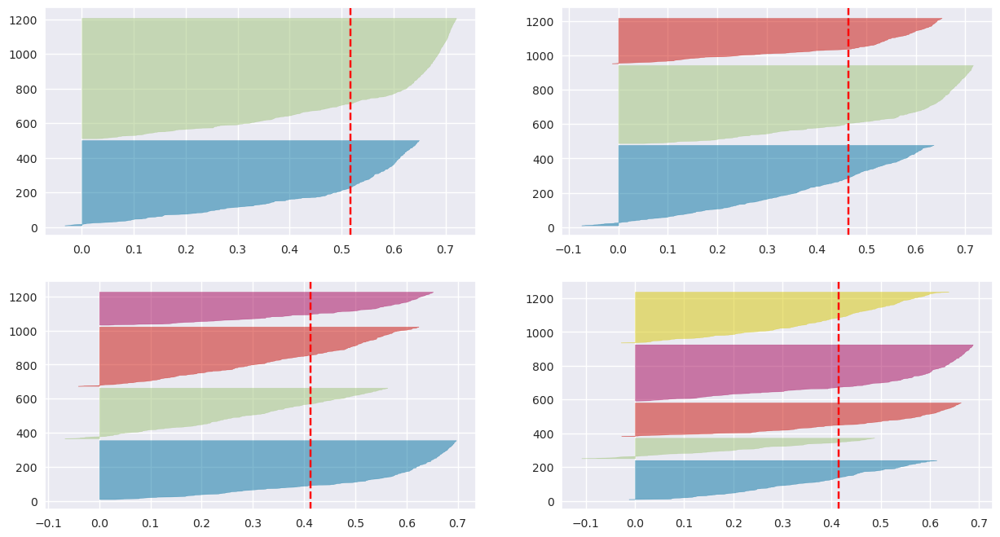

In [143]:
fig, ax = plt.subplots(2, 2, figsize=(15,8))

for k in range(2, 6):
    kmeans_PCA_jours = KMeans(n_clusters=k, init='random', n_init='auto', max_iter=100, random_state=42)
    q, mod = divmod(k, 2) 
    # Create SilhouetteVisualizer instance with KMeans instance
    visualizer = SilhouetteVisualizer(kmeans_PCA_jours, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(data_jours_pca )

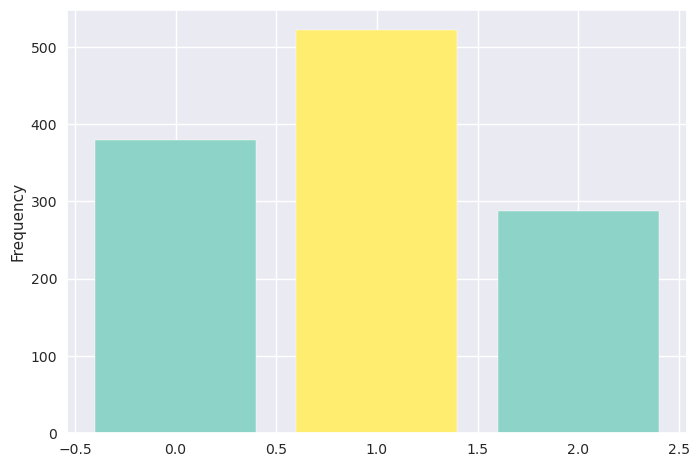

In [144]:
K = 2

kmeans_PCA_jours = KMeans(n_clusters=K, init='random', n_init='auto', random_state=0)
clusters_jours_pca = kmeans_PCA_jours.fit_predict(data_jours_pca)

# ----- #

cmap = plt.get_cmap('Set3',K)
plt.bar(*np.unique(clusters, return_counts=True), color=cmap.colors)
plt.ylabel("Frequency")
plt.show()

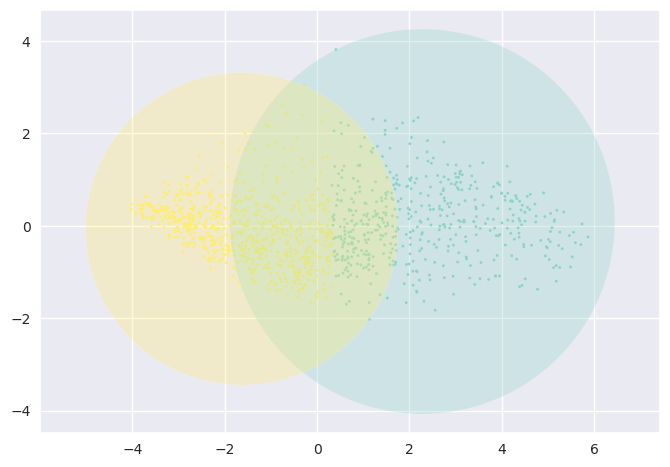

In [145]:
plotKmeans(kmeans_PCA_jours, data_jours_pca, 2)

col_0    0    1
bonus          
0      491  571
1        2  125


<Figure size 800x600 with 0 Axes>

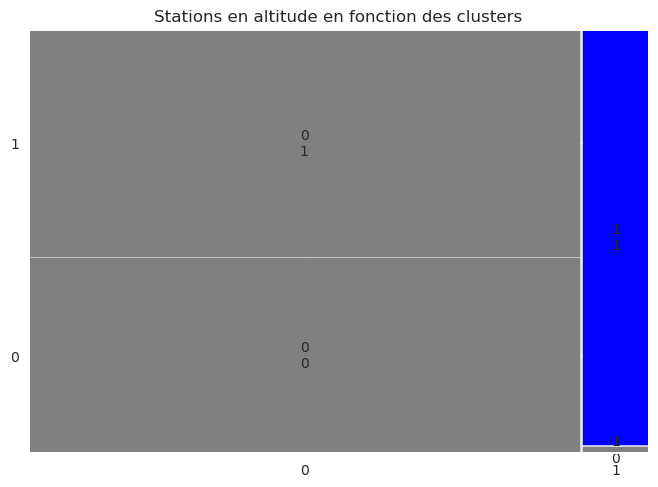

In [146]:
# Créer une table croisée des données bonus et des clusters

tbl4 = pd.crosstab( coord['bonus'], clusters_jours_pca)
print(tbl4)

props = lambda key: {'color': 'grey' if '0' in key else 'blue' if '1' in key else 'pink' }

# Réaliser un diagramme en mosaïque
plt.figure(figsize=(8, 6))
mosaic(tbl4.stack(), title="Stations en altitude en fonction des clusters",properties=props)
plt.show()


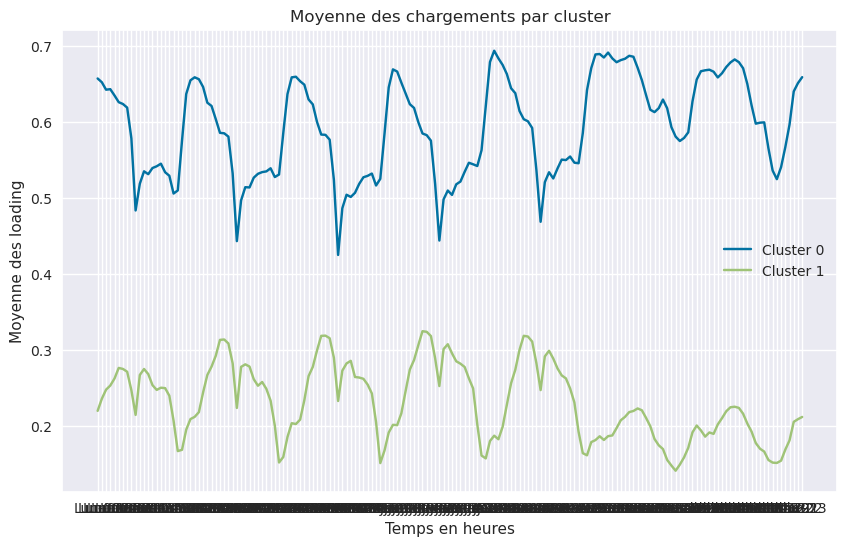

In [147]:
loading_sub4 = loading.iloc[:,:]
loading_sub4['cluster']=clusters_jours_pca
mean_loading4=loading_sub4.groupby('cluster').mean()
mean_loading4.head()

fig, ax = plt.subplots(figsize=(10, 6))

# Affichage des 4 lignes sur le même graphique
for i in range(2):
    ax.plot(mean_loading4.columns, mean_loading4.iloc[i], label=f'Cluster {i}')

plt.legend()
plt.title('Moyenne des chargements par cluster')
plt.xlabel('Temps en heures')
plt.ylabel('Moyenne des loading')
plt.show()


Comparaison des deux classifications :

Nombre de points différents : 38 sur 1189
Pourcentage de réussite : 96.80%


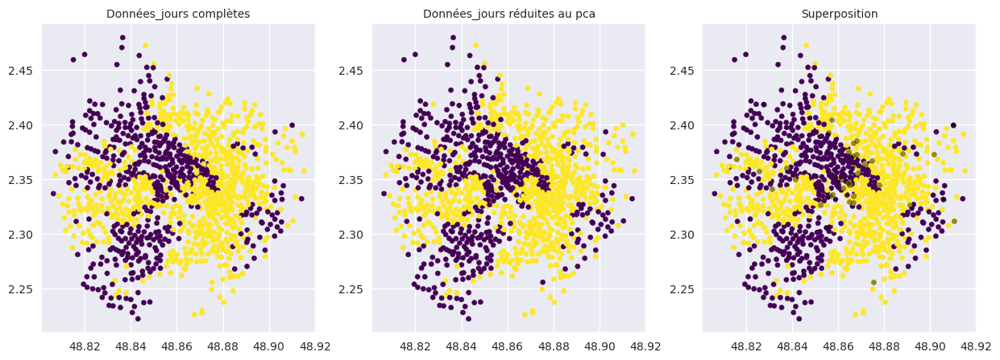

In [194]:
points_diff2 = clusters_jours != clusters_jours_pca

fig, axs = plt.subplots(1, 3, figsize = (15, 5))

#graphe 1 : données_jours complètes
im1 = axs[0].scatter(coord.latitude, coord.longitude, c = clusters_jours , cmap = 'viridis', s=20)
axs[0].set_title('Données_jours complètes', fontsize = 10)

#graphe 2 : données_jours réduites au pca
im2 = axs[1].scatter(coord.latitude, coord.longitude, c = clusters_jours_pca, cmap = 'viridis', s=20)
axs[1].set_title('Données_jours réduites au pca', fontsize = 10)

#graphe 3 : superposition des résultats avec affichage en noir des points différents
im3 = axs[2].scatter(coord.latitude, coord.longitude, c=clusters_jours, cmap='viridis', s=20, label='Données réduites au PCA')
axs[2].set_title('Superposition', fontsize=10)

# Superposition des points différents en noir sur le deuxième scatterplot
axs[2].scatter(coord.latitude[points_diff2], coord.longitude[points_diff2], color='black', s=20, alpha=0.4, label='Différences')

# Calcul du nombre de points différents
num_diff_points2 = np.sum(points_diff2)

# Calcul du pourcentage de réussite
pourcentage_reussite2 = (1- num_diff_points2 / len(clusters_jours)) * 100

# Affichage du résultat
print(f"Nombre de points différents : {num_diff_points2} sur {len(clusters_jours)}")
print(f"Pourcentage de réussite : {pourcentage_reussite2:.2f}%")

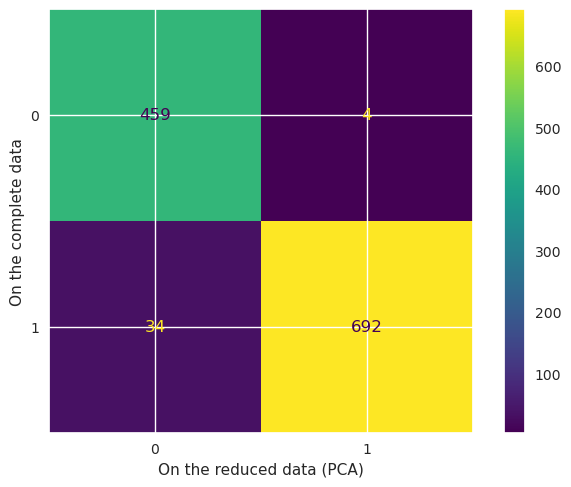

In [149]:
ConfusionMatrixDisplay(confusion_matrix(clusters_jours, clusters_jours_pca)).plot()
plt.xlabel('On the reduced data (PCA)')
plt.ylabel('On the complete data')
plt.show()

In [121]:
# reclassement des clusters


Classes size: [459 692]
Class (in the classif1 numbering): [0 1]



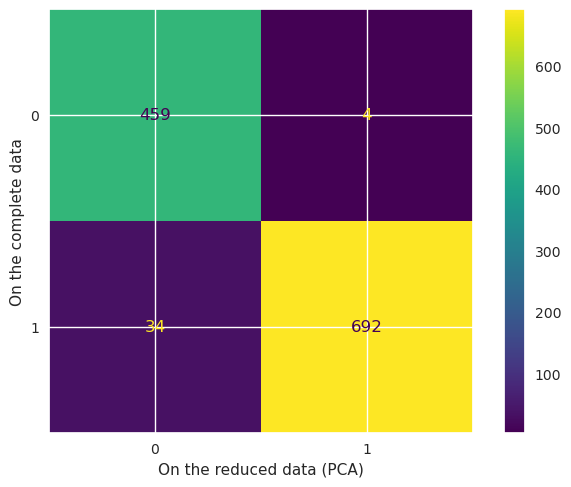

,groupe0,groupe1
groupe_pca0,459,4
groupe_pca1,34,692


In [248]:
cm2, clusters_pca_sorted_jour = matchClasses(clusters_jours, clusters_jours_pca)

ConfusionMatrixDisplay(cm2).plot()
plt.xlabel('On the reduced data (PCA)')
plt.ylabel('On the complete data')
plt.show()


#on convertit la table de confusion en dataframe 
df_cm2 = pd.DataFrame(cm2, columns=['groupe0', 'groupe1'], index=['groupe_pca0', 'groupe_pca1'])
df_cm2.head()

En affichant la table de contingence, on voit que le nombre de stations mal classifié est très faible, cela nous permet de conclure (directement et non en passant par une CA) que nos méthodes de classification sont comparables.

## Gaussian Mixture Models 

On peut utiliser les données issues de l'ACP car elle résume bien 

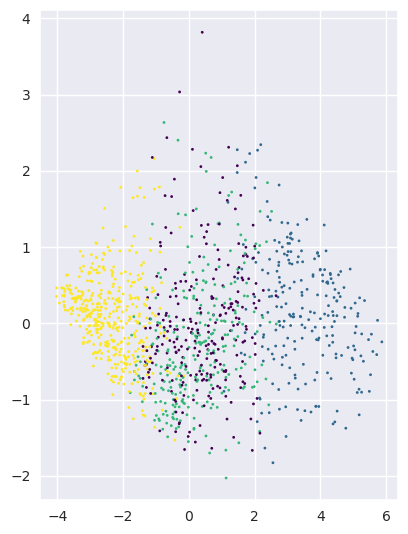

In [244]:
K = 2
cmap = plt.get_cmap('Set3', K)

gmm = GaussianMixture(n_components=K, n_init=3)
clusters_gmm_heures = gmm.fit_predict(loading)

# --- #

plt.subplot(1,2,1)
plt.scatter(data_jours_pca[:,0], data_jours_pca[:,1], c=clusters_gmm, s=1, linewidths=1, cmap='viridis')
plt.grid(True)


plt.tight_layout()
plt.show()

Critère BIC :

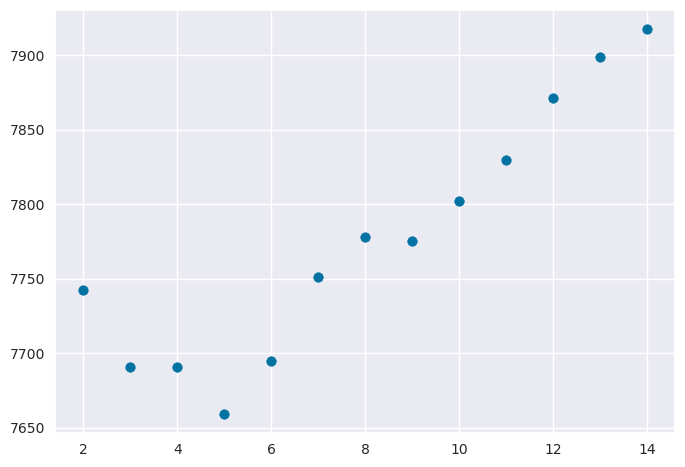

In [245]:
k_max = 15

bic = []
for k in range(2, k_max):
    gmm = GaussianMixture(n_components=k, init_params='kmeans', n_init=3)
    gmm.fit(data_jours_pca)
    bic.append(gmm.bic(data_jours_pca))
bic = np.array(bic)

plt.scatter(range(2, k_max), bic)
plt.show()

En appliquant le critère BIC on devrait garder 5 variables pour expliquer nos données.

Réalisons maintenant une étude comparative des différentes méthodes de clusters : 


Classes size: [369 644]
Class (in the classif1 numbering): [1 0]



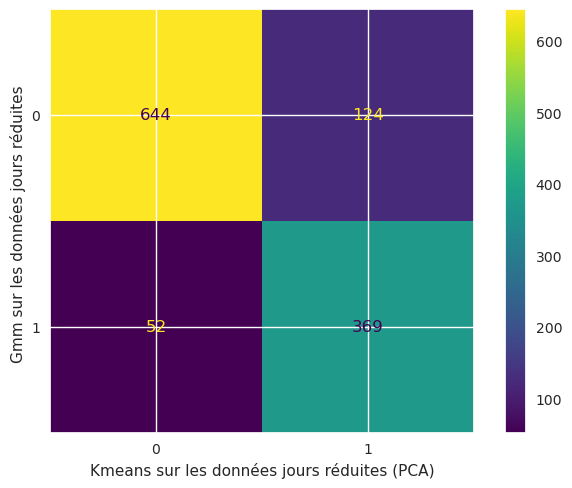

,groupe0,groupe1
groupe_pca0,644,124
groupe_pca1,52,369


In [249]:
cm2, clusters_pca_sorted = matchClasses(clusters_gmm_heures, clusters_jours_pca)


ConfusionMatrixDisplay(cm2).plot()

plt.xlabel('Kmeans sur les données jours réduites (PCA)')
plt.ylabel('Gmm sur les données jours réduites ')
plt.show()

df_kmeans_gmm2 = pd.DataFrame(cm2, columns=['groupe0', 'groupe1'], index=['groupe_pca0', 'groupe_pca1'])
df_kmeans_gmm2.head()

# Etude sur le jeu de données par heures

In [255]:
# Calcul des moyennes pour chaque heure de la journée
minuit_am = loading.iloc[:, [0, 24, 48, 72, 96, 120, 144]].mean(axis=1)
une_am = loading.iloc[:, [1, 25, 49, 73, 97, 121, 145]].mean(axis=1)
deux_am = loading.iloc[:, [2, 26, 50, 74, 98, 122, 146]].mean(axis=1)
trois_am = loading.iloc[:, [3, 27, 51, 75, 99, 123, 147]].mean(axis=1)
quatre_am = loading.iloc[:, [4, 28, 52, 76, 100, 124, 148]].mean(axis=1)
cinq_am = loading.iloc[:, [5, 29, 53, 77, 101, 125, 149]].mean(axis=1)
six_am = loading.iloc[:, [6, 30, 54, 78, 102, 126, 150]].mean(axis=1)
sept_am = loading.iloc[:, [7, 31, 55, 79, 103, 127, 151]].mean(axis=1)
huit_am = loading.iloc[:, [8, 32, 56, 80, 104, 128, 152]].mean(axis=1)
neuf_am = loading.iloc[:, [9, 33, 57, 81, 105, 129, 153]].mean(axis=1)
dix_am = loading.iloc[:, [10, 34, 58, 82, 106, 130, 154]].mean(axis=1)
onze_am = loading.iloc[:, [11, 35, 59, 83, 107, 131, 155]].mean(axis=1)
minuit_pm = loading.iloc[:, [12, 36, 60, 84, 108, 132, 156]].mean(axis=1)
une_pm = loading.iloc[:, [13, 37, 61, 85, 109, 133, 157]].mean(axis=1)
deux_pm = loading.iloc[:, [14, 38, 62, 86, 110, 134, 158]].mean(axis=1)
trois_pm = loading.iloc[:, [15, 39, 63, 87, 111, 135, 159]].mean(axis=1)
quatre_pm = loading.iloc[:, [16, 40, 64, 88, 112, 136, 160]].mean(axis=1)
cinq_pm = loading.iloc[:, [17, 41, 65, 89, 113, 137, 161]].mean(axis=1)
six_pm = loading.iloc[:, [18, 42, 66, 90, 114, 138, 162]].mean(axis=1)
sept_pm = loading.iloc[:, [19, 43, 67, 91, 115, 139, 163]].mean(axis=1)
huit_pm = loading.iloc[:, [20, 44, 68, 92, 116, 140, 164]].mean(axis=1)
neuf_pm = loading.iloc[:, [21, 45, 69, 93, 117, 141, 165]].mean(axis=1)
dix_pm = loading.iloc[:, [22, 46, 70, 94, 118, 142, 166]].mean(axis=1)
onze_pm = loading.iloc[:, [23, 47, 71, 95, 119, 143, 167]].mean(axis=1)

# Création du nouveau DataFrame
data_heures = pd.DataFrame({
    'Minuit': minuit_am,
    '1h': une_am,
    '2h': deux_am,
    '3h': trois_am,
    '4h': quatre_am,
    '5h': cinq_am,
    '6h': six_am,
    '7h': sept_am,
    '8h': huit_am,
    '9h': neuf_am,
    '10h': dix_am,
    '11h': onze_am,
    '12h': minuit_pm,
    '13h': une_pm,
    '14h': deux_pm,
    '15h': trois_pm,
    '16h': quatre_pm,
    '17h': cinq_pm,
    '18h': six_pm,
    '19h': sept_pm,
    '20h': huit_pm,
    '21h': neuf_pm,
    '22h': dix_pm,
    '23h': onze_pm
})

print(data_heures)

        Minuit        1h        2h        3h        4h        5h        6h  \
1     0.317475  0.331647  0.363975  0.383990  0.395139  0.400052  0.410634   
2     0.838509  0.826087  0.807453  0.819876  0.826087  0.826087  0.826087   
3     0.475774  0.413485  0.391440  0.388795  0.375663  0.354884  0.352287   
4     0.231293  0.238095  0.231293  0.251701  0.251701  0.251701  0.251701   
5     0.557892  0.508146  0.461705  0.419069  0.376858  0.347513  0.313966   
...        ...       ...       ...       ...       ...       ...       ...   
1185  0.149068  0.248447  0.291925  0.285714  0.298137  0.298419  0.310559   
1186  0.266667  0.301587  0.336508  0.352381  0.371429  0.387302  0.387302   
1187  0.337931  0.376355  0.434483  0.444171  0.458621  0.473235  0.459113   
1188  0.435918  0.439456  0.439456  0.489524  0.506667  0.493061  0.507755   
1189  0.369487  0.393371  0.384299  0.335192  0.321799  0.293594  0.306987   

            7h        8h        9h  ...       14h       15h    

In [256]:
# Standardisation des données
données_heures_stand = scaler.fit_transform(data_heures)
print(données_heures_stand)

[[-0.26059368 -0.24443098 -0.15343027 ...  0.42700054  0.61987643
   0.3967952 ]
 [ 1.48946481  1.42191642  1.36209942 ...  1.25771273  1.346584
   1.3905872 ]
 [ 0.27110493  0.03137571 -0.05957013 ...  0.66251348  0.61110604
   0.54912397]
 ...
 [-0.19188515 -0.09375902  0.08752181 ... -0.60558799 -0.63373274
  -0.44806465]
 [ 0.1372362   0.1189026   0.10451646 ...  0.44315134  0.38768311
   0.30310465]
 [-0.08589616 -0.03640952 -0.08397492 ...  0.07271845 -0.0113928
  -0.13886283]]


In [257]:
pca_3 = PCA()
data_heures_pca = pca_3.fit_transform(données_heures_stand)

on garde 2 composants pour le PCA


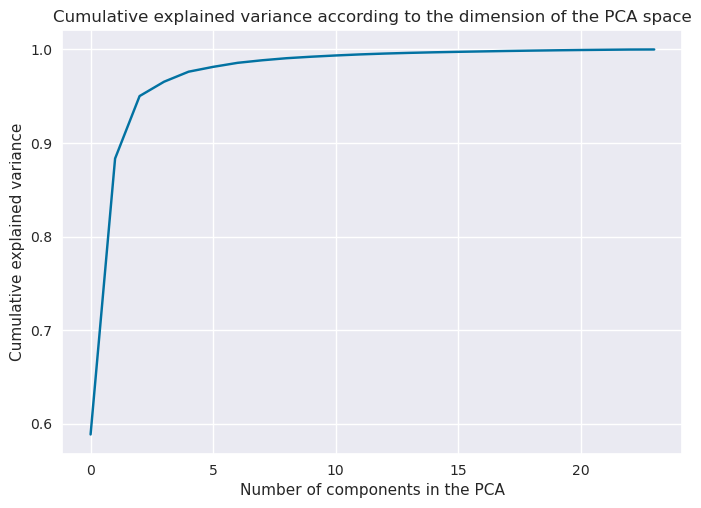

In [258]:
plt.plot(np.cumsum(pca_3.explained_variance_ratio_))

plt.title('Cumulative explained variance according to the dimension of the PCA space')
plt.xlabel('Number of components in the PCA')
plt.ylabel('Cumulative explained variance');


#permet de connaître le nombre de variables à garder pour expliquer 90% de la variance 

#pca = PCA(0.90).fit(loading) 

pca_3 = PCA(0.85).fit(données_heures_stand) #pour savoir directement le nombre de composants nécessaire pour représenter une explication de 85% de la variance
pca_3.n_components_ #on affiche le nb de composants qu'on garde pour la PCA
print(f"on garde {pca_3.n_components_} composants pour le PCA")


In [259]:
pca_3 = PCA(n_components = 2)
data_heures_pca = pca_3.fit_transform(données_heures_stand) #même chose que fit puis transform dans notre cas à nous

print(100*pca_3.explained_variance_ratio_)


print('--- PCA ---')
print('Initial dimension:', données_heures_stand.shape)
print('Dimension after projection:', data_heures_pca.shape)

print('')

print('--- Explained variance ---')
print('Component 1:', round(pca_3.explained_variance_[0],2), 'i.e.', round(100*pca_3.explained_variance_ratio_[0],2), '% of the total variance')
print('Component 2:', round(pca_3.explained_variance_[1],2), 'i.e.', round(100*pca_3.explained_variance_ratio_[1],2), '% of the total variance')


[58.85288786 29.49142488]
--- PCA ---
Initial dimension: (1189, 24)
Dimension after projection: (1189, 2)

--- Explained variance ---
Component 1: 14.14 i.e. 58.85 % of the total variance
Component 2: 7.08 i.e. 29.49 % of the total variance


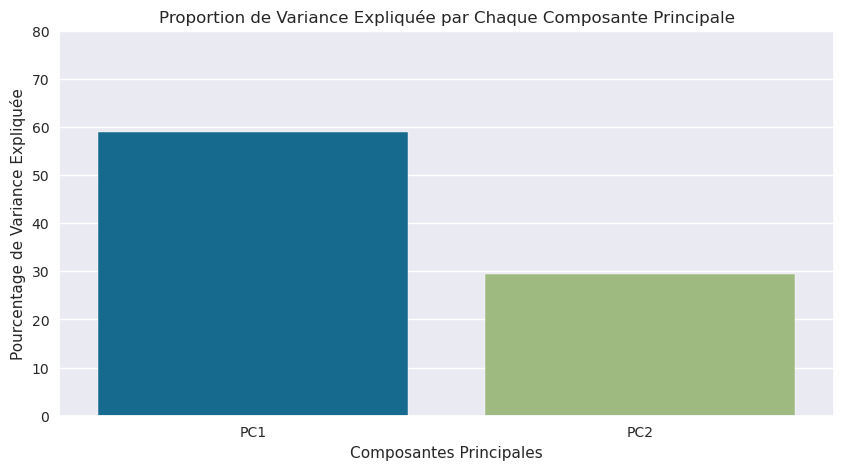

In [260]:
plt.figure(figsize=(10, 5))
sns.barplot(x=[f"PC{i+1}" for i in range(len(pca_3.explained_variance_ratio_))], y=pca_3.explained_variance_ratio_ * 100)
plt.xlabel("Composantes Principales")
plt.ylabel("Pourcentage de Variance Expliquée")
plt.title("Proportion de Variance Expliquée par Chaque Composante Principale")
plt.ylim(0,80)  # limiter l'axe y à la plage spécifiée
plt.show()


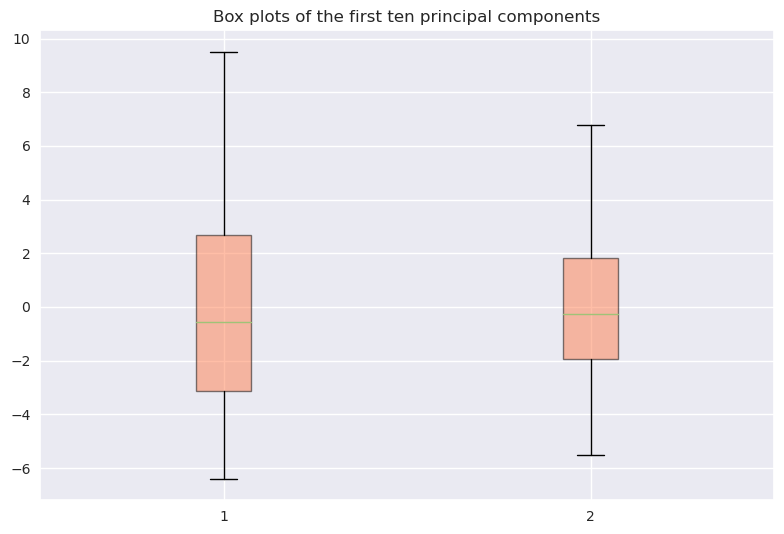

In [261]:
box = plt.boxplot(data_heures_pca[:,:10], patch_artist=True)
plt.setp(box["boxes"], facecolor="coral", alpha=.5)
plt.title("Box plots of the first ten principal components")
plt.tight_layout()
plt.show()

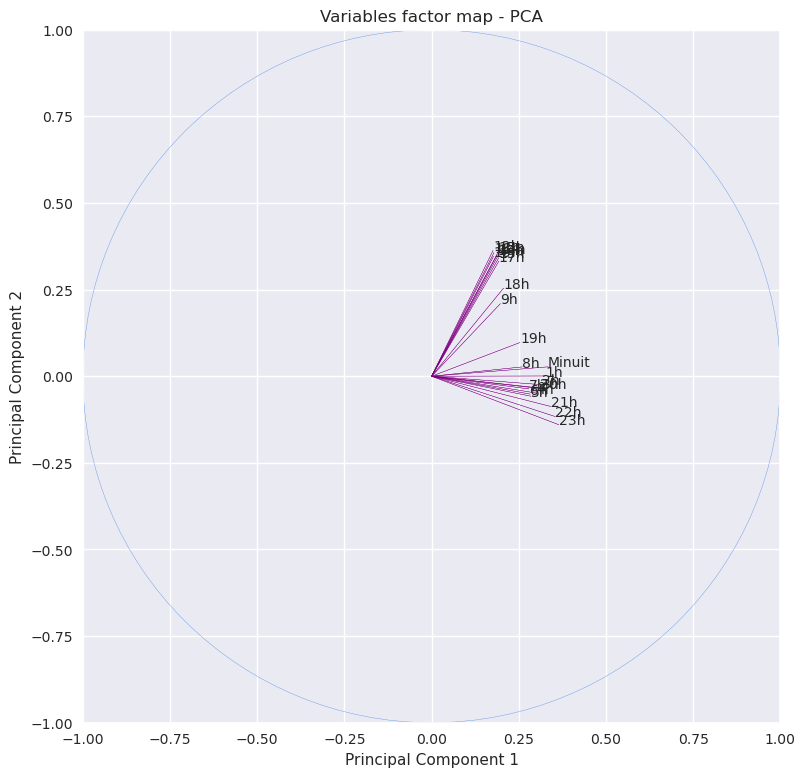

In [262]:
coord1 = pca.components_[0] * np.sqrt(pca_3.explained_variance_[0])
coord2 = pca.components_[1] * np.sqrt(pca_3.explained_variance_[1])

fig = plt.figure(figsize=(9, 9))
ax = fig.add_subplot(1, 1, 1)
for i, j, nom in zip(coord1, coord2, data_heures.columns):
    plt.text(i, j, nom, fontsize=10)
    plt.arrow(0, 0, i, j, color = 'purple', alpha=0.7, width = 0.0001)

plt.axis((-1, 1, -1, 1))
plt.gcf().gca().add_artist(plt.Circle((0, 0), radius = 1, color = 'cornflowerblue', fill = False))

plt.title('Variables factor map - PCA')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')

plt.grid(True)
plt.show()

## Méthode de clustering avec k-means


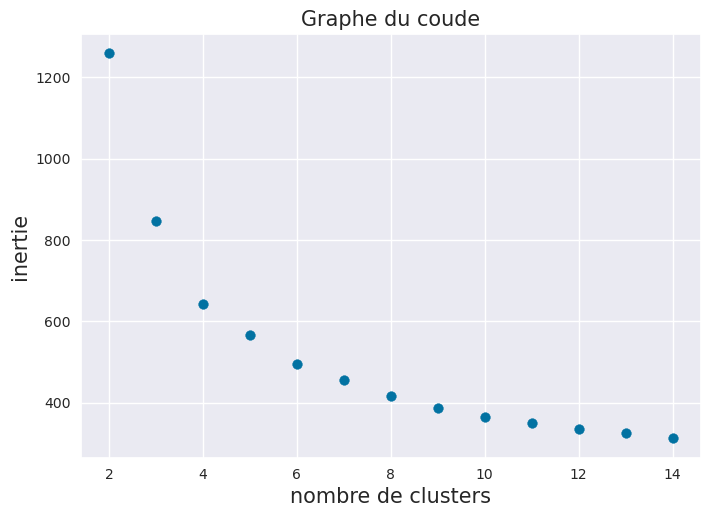

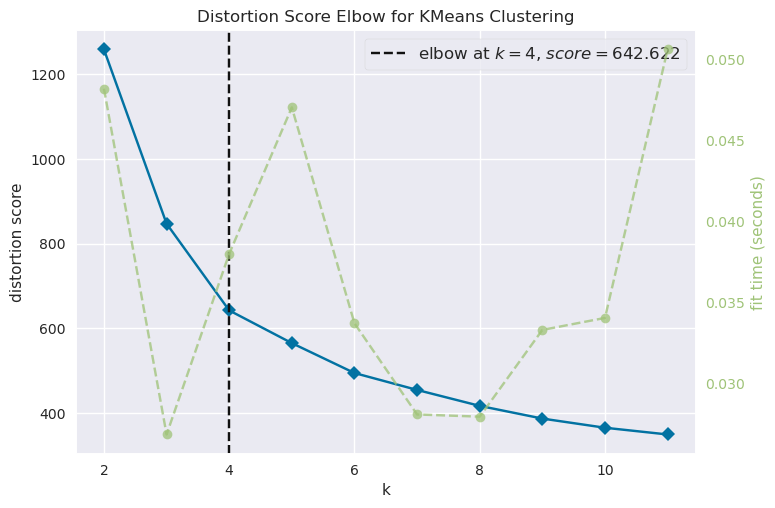

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [263]:
inertia = []
for k in range(1, 15):
    kmeans_heures = KMeans(n_clusters=k, init='random', n_init='auto', max_iter=100, random_state=42)
    kmeans_heures.fit(data_heures )
    inertia.append(kmeans_heures.inertia_)
inertia = np.array(inertia)


plt.scatter(range(2, 15), inertia[1:])
plt.xlabel('nombre de clusters', fontsize = 15)
plt.ylabel('inertie', fontsize = 15)
plt.title("Graphe du coude", fontsize = 15)
plt.show()


# --- #


# Using yellowbrick

kmeans_heures = KMeans(init='random', n_init='auto', max_iter=100, random_state=42)
visualizer = KElbowVisualizer(kmeans_heures, k=(2,12))

visualizer.fit(data_heures )    # Fit the data to the visualizer
visualizer.show()    # Finalize and render the figure

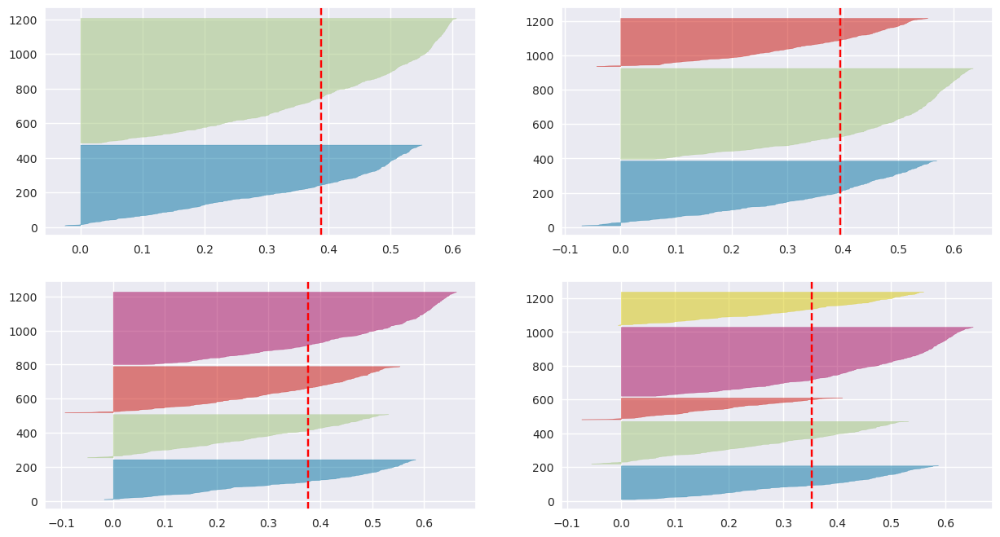

In [264]:
fig, ax = plt.subplots(2, 2, figsize=(15,8))

for k in range(2, 6):
    kmeans_heures = KMeans(n_clusters=k, init='random', n_init='auto', max_iter=100, random_state=42)
    q, mod = divmod(k, 2) 
    # Create SilhouetteVisualizer instance with KMeans instance
    visualizer = SilhouetteVisualizer(kmeans_heures, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(data_heures )

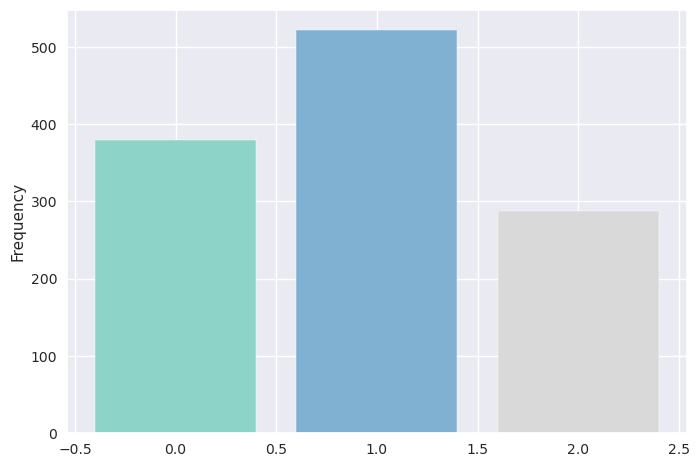

In [265]:
## INUTILE ??

K = 4

kmeans_heures = KMeans(n_clusters=K, init='random', n_init='auto', random_state=0)
clusters_heures = kmeans_heures.fit_predict(data_heures)

# ----- #

cmap = plt.get_cmap('Set3',K)
plt.bar(*np.unique(clusters, return_counts=True), color=cmap.colors)
plt.ylabel("Frequency")
plt.show()

InvalidIndexError: (slice(None, None, None), 0)

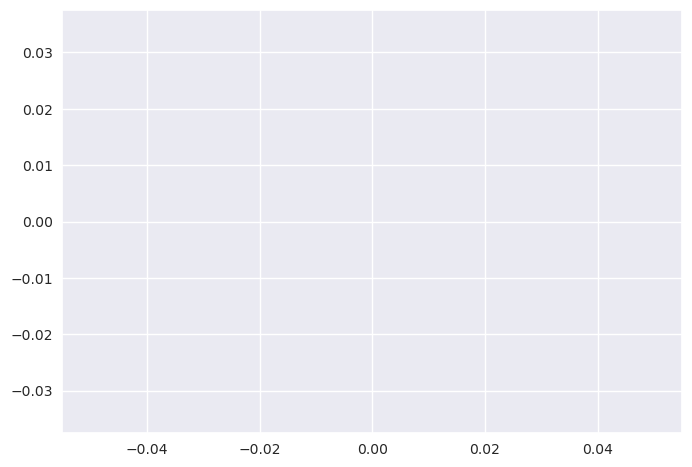

In [266]:
plotKmeans(kmeans_heures, data_heures, 4)

In [ ]:
# Créer une table croisée des données bonus et des clusters

tbl5 = pd.crosstab( coord['bonus'], clusters_heures)
print(tbl5)

props = lambda key: {'color': 'grey' if '0' in key else 'blue' if '1' in key else 'pink' }

# Réaliser un diagramme en mosaïque
plt.figure(figsize=(8, 6))
mosaic(tbl5.stack(), title="Stations en altitude en fonction des clusters",properties=props)
plt.show()


In [ ]:
loading_sub5 = loading.iloc[:,:]
loading_sub5['cluster']=clusters_heures
mean_loading5=loading_sub5.groupby('cluster').mean()
mean_loading5.head()

fig, ax = plt.subplots(figsize=(10, 6))

# Affichage des 4 lignes sur le même graphique
for i in range(4):
    ax.plot(mean_loading5.columns, mean_loading5.iloc[i], label=f'Cluster {i}')

plt.legend()
plt.title('Moyenne des chargements par cluster')
plt.xlabel('Temps en heures')
plt.ylabel('Moyenne des loading')
plt.show()


In [267]:
# Etude sur data_heures_pca

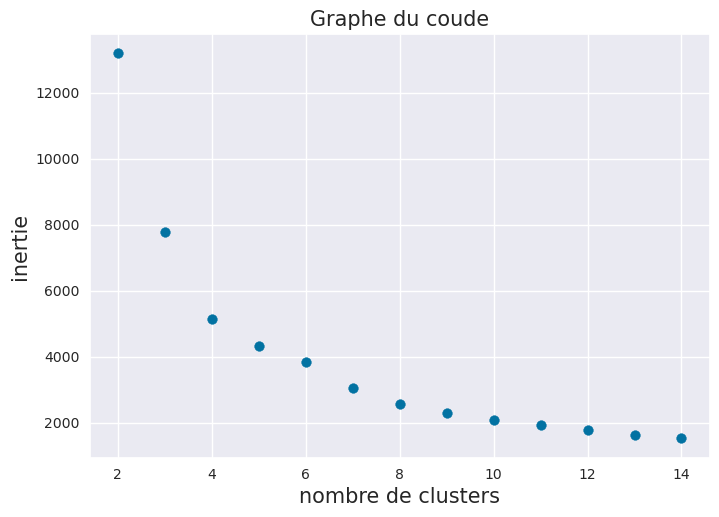

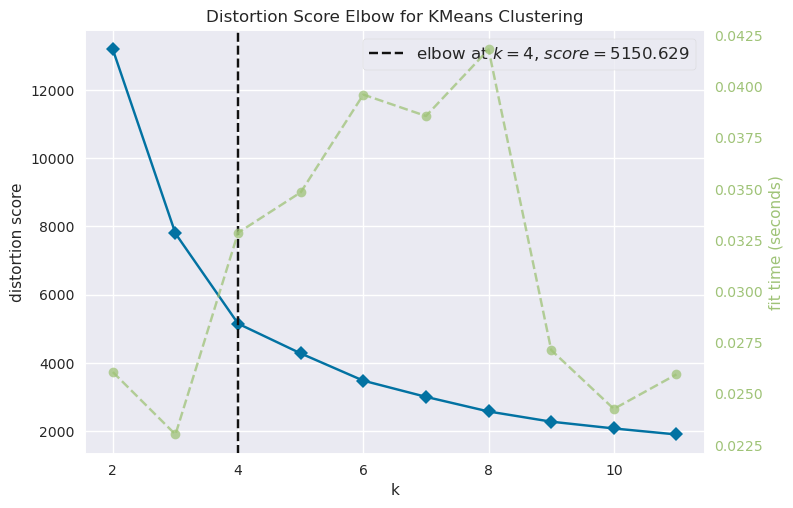

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [268]:
inertia = []
for k in range(1, 15):
    kmeans_PCA_heures = KMeans(n_clusters=k, init='k-means++', n_init='auto', max_iter=100, random_state=42)
    kmeans_PCA_heures.fit(data_heures_pca )
    inertia.append(kmeans_PCA_heures.inertia_)
inertia = np.array(inertia)


plt.scatter(range(2, 15), inertia[1:])
plt.xlabel('nombre de clusters', fontsize = 15)
plt.ylabel('inertie', fontsize = 15)
plt.title("Graphe du coude", fontsize = 15)
plt.show()


# --- #


# Using yellowbrick

kmeans_PCA_heures = KMeans(init='random', n_init='auto', max_iter=100, random_state=42)
visualizer = KElbowVisualizer(kmeans_PCA_heures, k=(2,12))

visualizer.fit(data_heures_pca)    # Fit the data to the visualizer
visualizer.show()    # Finalize and render the figure

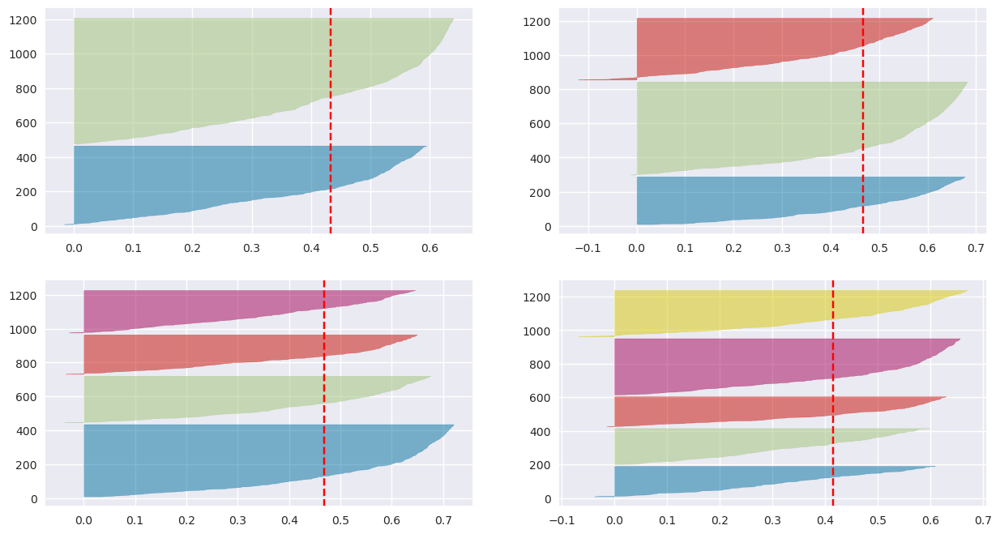

In [269]:
fig, ax = plt.subplots(2, 2, figsize=(15,8))

for k in range(2, 6):
    kmeans_PCA_heures = KMeans(n_clusters=k, init='random', n_init='auto', max_iter=100, random_state=42)
    q, mod = divmod(k, 2) 
    # Create SilhouetteVisualizer instance with KMeans instance
    visualizer = SilhouetteVisualizer(kmeans_PCA_heures, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(data_heures_pca )

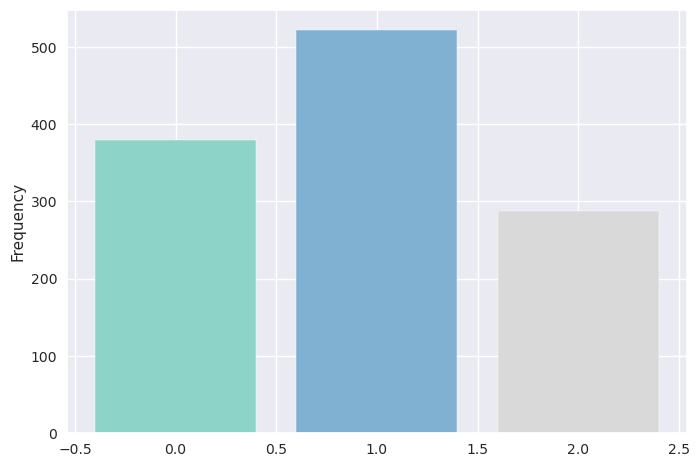

In [270]:
K = 4

kmeans_PCA_heures = KMeans(n_clusters=K, init='random', n_init='auto', random_state=0)
clusters_heures_pca = kmeans_PCA_heures.fit_predict(data_heures_pca )

# ----- #

cmap = plt.get_cmap('Set3',K)
plt.bar(*np.unique(clusters, return_counts=True), color=cmap.colors)
plt.ylabel("Frequency")
plt.show()

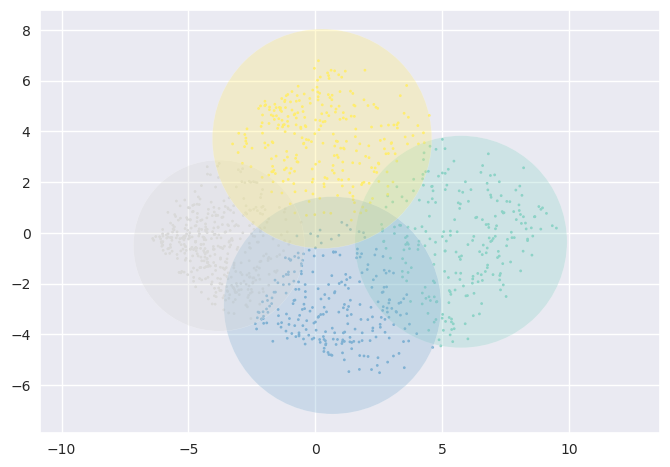

In [271]:
plotKmeans(kmeans_PCA_heures, data_heures_pca, 4)

col_0    0    1    2    3
bonus                    
0      235  244  310  273
1        1   10  114    2


<Figure size 800x600 with 0 Axes>

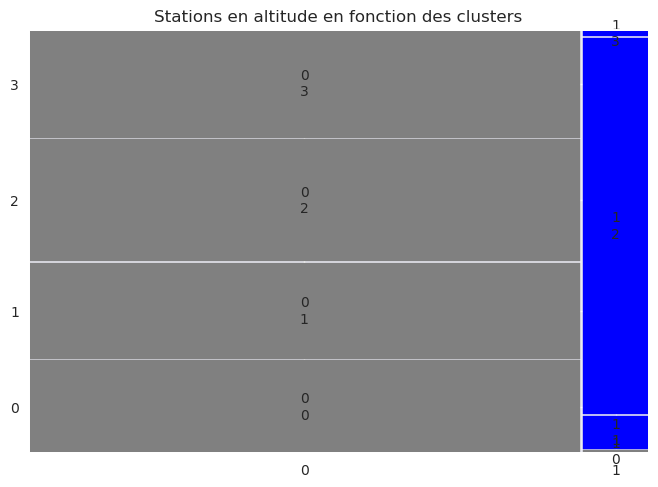

In [272]:
# Créer une table croisée des données bonus et des clusters

tbl6 = pd.crosstab( coord['bonus'], clusters_heures_pca)
print(tbl6)

props = lambda key: {'color': 'grey' if '0' in key else 'blue' if '1' in key else 'pink' }

# Réaliser un diagramme en mosaïque
plt.figure(figsize=(8, 6))
mosaic(tbl6.stack(), title="Stations en altitude en fonction des clusters",properties=props)
plt.show()


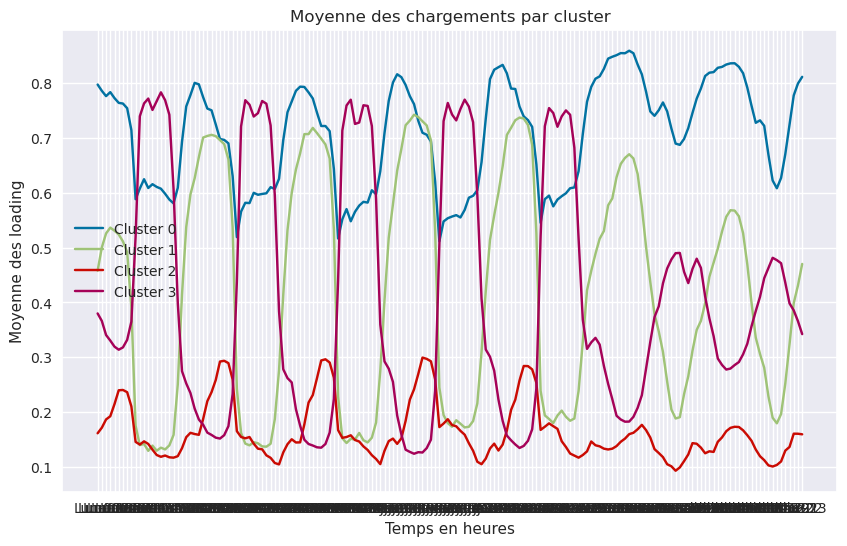

In [273]:
loading_sub6 = loading.iloc[:,:]
loading_sub6['cluster']=clusters_heures_pca
mean_loading6=loading_sub6.groupby('cluster').mean()
mean_loading6.head()

fig, ax = plt.subplots(figsize=(10, 6))

# Affichage des 4 lignes sur le même graphique
for i in range(4):
    ax.plot(mean_loading6.columns, mean_loading6.iloc[i], label=f'Cluster {i}')

plt.legend()
plt.title('Moyenne des chargements par cluster')
plt.xlabel('Temps en heures')
plt.ylabel('Moyenne des loading')
plt.show()


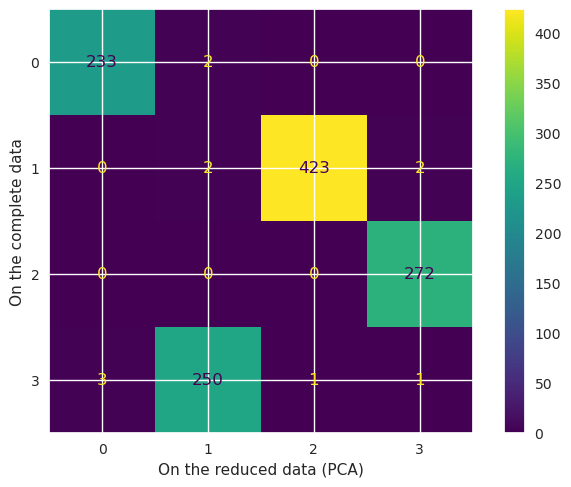

In [274]:
ConfusionMatrixDisplay(confusion_matrix(clusters_heures, clusters_heures_pca)).plot()
plt.xlabel('On the reduced data (PCA)')
plt.ylabel('On the complete data')
plt.show()

In [ ]:
#Reclassement des groupes : 


Classes size: [233 250 423 272]
Class (in the classif1 numbering): [0 3 1 2]



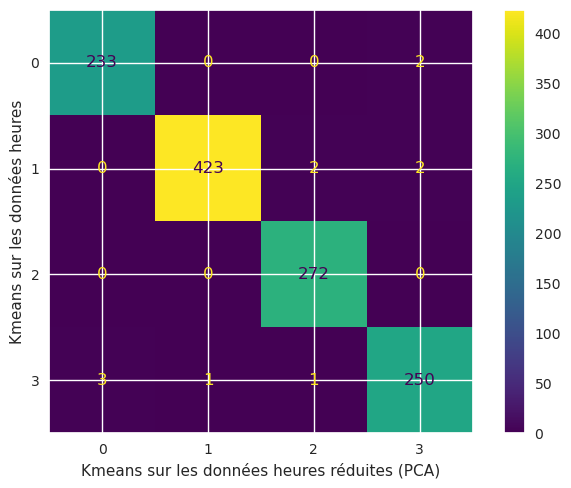

,groupe0,groupe1,groupe2,groupe3
groupe_pca0,233,0,0,2
groupe_pca1,0,423,2,2
groupe_pca2,0,0,272,0
groupe_pca3,3,1,1,250


In [275]:
cm, clusters_pca_sorted = matchClasses(clusters_heures, clusters_heures_pca)

ConfusionMatrixDisplay(cm).plot()
plt.xlabel('Kmeans sur les données heures réduites (PCA)')
plt.ylabel('Kmeans sur les données heures')
plt.show()

#on convertit la table de confusion en dataframe 
df_cm3 = pd.DataFrame(cm, columns=['groupe0', 'groupe1', 'groupe2', 'groupe3'], index=['groupe_pca0', 'groupe_pca1', 'groupe_pca2', 'groupe_pca3'])
df_cm3.head()

Nombre de points différents : 1189 sur 1189
Pourcentage de réussite : 0.00%


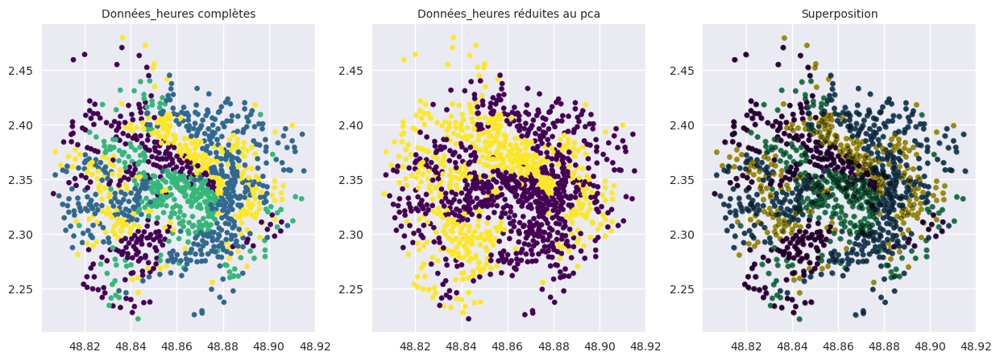

In [279]:
points_diff3 = clusters_heures != clusters_pca_sorted

fig, axs = plt.subplots(1, 3, figsize = (15, 5))

#graphe 1 : données_jours complètes
im1 = axs[0].scatter(coord.latitude, coord.longitude, c = clusters_heures , cmap = 'viridis', s=20)
axs[0].set_title('Données_heures complètes', fontsize = 10)

#graphe 2 : données_jours réduites au pca
im2 = axs[1].scatter(coord.latitude, coord.longitude, c = clusters_pca_sorted, cmap = 'viridis', s=20)
axs[1].set_title('Données_heures réduites au pca', fontsize = 10)

#graphe 3 : superposition des résultats avec affichage en noir des points différents
im3 = axs[2].scatter(coord.latitude, coord.longitude, c=clusters_heures, cmap='viridis', s=20, label='Données réduites au PCA')
axs[2].set_title('Superposition', fontsize=10)

# Superposition des points différents en noir sur le deuxième scatterplot
axs[2].scatter(coord.latitude[points_diff3], coord.longitude[points_diff3], color='black', alpha=0.4, s=20, label='Différences')

# Calcul du nombre de points différents
num_diff_points3 = np.sum(points_diff3)

# Calcul du pourcentage de réussite
pourcentage_reussite3 = (1- num_diff_points3 / len(clusters_heures)) * 100

# Affichage du résultat
print(f"Nombre de points différents : {num_diff_points3} sur {len(clusters_heures)}")
print(f"Pourcentage de réussite : {pourcentage_reussite3:.2f}%")

La table de contingence nous montre une nouvelle fois qu'il n'y a que quelques stations qui sont mal classés par GMM par rapport aux classements de Kmeans donc on n'a pas forcément besoin de faire une CA.

## Gaussian Mixture Model

On a eu des résultats d'ACP sur les heures très mauvaises, donc on continue à travailler sur le jeu de données totales

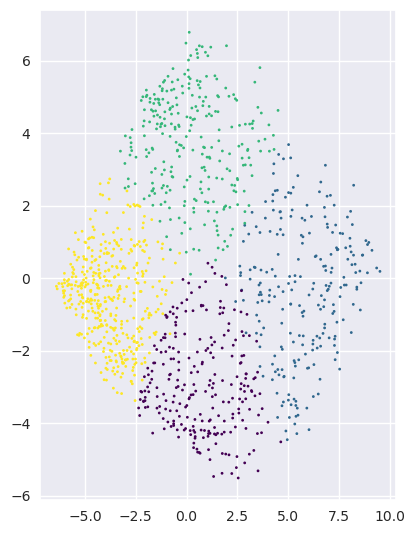

In [280]:
K = 4
cmap = plt.get_cmap('Set3', K)

gmm = GaussianMixture(n_components=K, n_init=3)
clusters_gmm_heures = gmm.fit_predict(loading)

# --- #

plt.subplot(1,2,1)
plt.scatter(data_heures_pca[:,0], data_heures_pca[:,1], c=clusters_gmm, s=1, linewidths=1, cmap='viridis')
plt.grid(True)


plt.tight_layout()
plt.show()

Critère BIC :

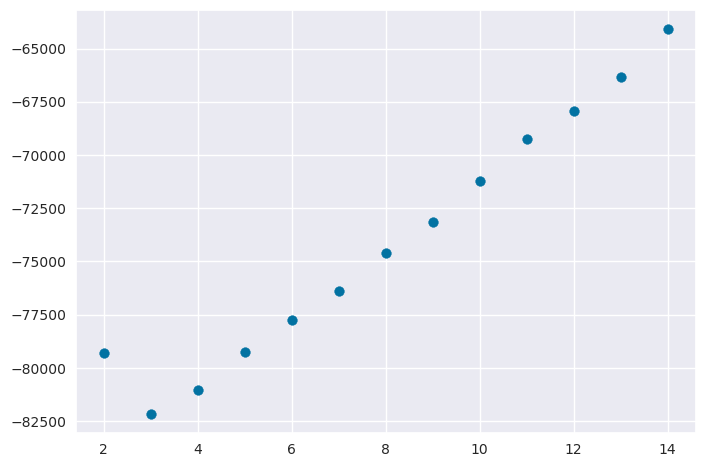

In [281]:
k_max = 15

bic = []
for k in range(2, k_max):
    gmm = GaussianMixture(n_components=k, init_params='kmeans', n_init=3)
    gmm.fit(data_heures)
    bic.append(gmm.bic(data_heures))
bic = np.array(bic)

plt.scatter(range(2, k_max), bic)
plt.show()


En appliquant le critère BIC on devrait garder 3 variables.

Comparons les deux méthodes de classifications : 


Classes size: [233 246 423 272]
Class (in the classif1 numbering): [0 1 3 2]



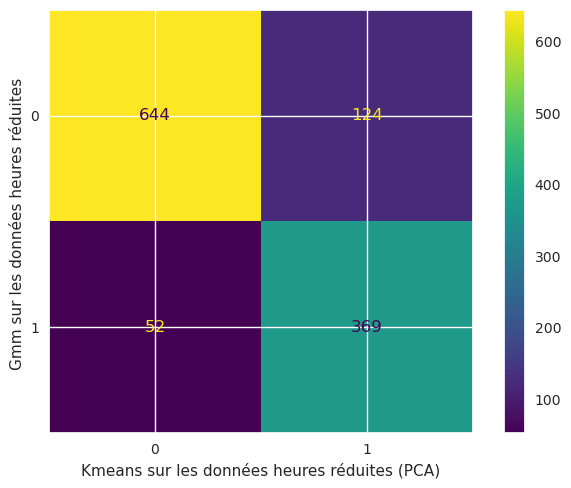

,groupe0,groupe1
groupe_pca0,644,124
groupe_pca1,52,369


In [283]:
cm3, clusters_pca_sorted = matchClasses(clusters_gmm_heures, clusters_heures_pca)


ConfusionMatrixDisplay(cm2).plot()

plt.xlabel('Kmeans sur les données heures réduites (PCA)')
plt.ylabel('Gmm sur les données heures réduites ')
plt.show()

df_kmeans_gmm2 = pd.DataFrame(cm2, columns=['groupe0', 'groupe1'], index=['groupe_pca0', 'groupe_pca1'])
df_kmeans_gmm2.head()